#import libraries

In [1]:
!pip install -q transformers[torch]
!pip install -q python-bidi
!pip install -q hazm
!pip install evaluate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 49.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 892.6/892.6 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 22.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 63.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 68.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.0/235.0 kB 29.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.24.3 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━

In [2]:
import pandas as pd
import numpy as np
import string
import nltk
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
import sklearn
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import spacy
import re
from hazm import Normalizer, word_tokenize, stopwords_list
import os
from wordcloud import WordCloud, STOPWORDS
from bidi import algorithm as bidi
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import matplotlib.pyplot as plt
import string
from transformers import AutoTokenizer, AutoModelForSequenceClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import torch
from tqdm import tqdm
from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [3]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True


# Exploratory Data Analysis (EDA) on Movie Dataset

The Exploratory Data Analysis (EDA) process is a crucial step to understand the characteristics and patterns present in a dataset. In this notebook, we'll perform EDA on a movie dataset to gain insights into various aspects such as genre distribution, release years, runtime, and ratings for both Persian and English language movies.

During the EDA process, we'll explore the dataset by:

1. Analyzing the genre distribution for Persian and English movies to identify popular genres.
2. Examining the release year trends for Persian and English movies to understand the distribution over time.
3. Investigating the runtime statistics for Persian and English movies to study the typical movie lengths.
4. Evaluating the rating distributions for Persian and English movies to gauge audience preferences.
...

The EDA process is iterative, and additional analyses may be required based on the insights gained from the initial exploration. The goal is to develop a comprehensive understanding of the dataset for both Persian and English language movies before proceeding with further analysis or modeling.

Feel free to explore the dataset creatively and provide any additional insights or visualizations that you find interesting or valuable. We encourage you to bring your unique perspective and creativity to enhance the EDA process.

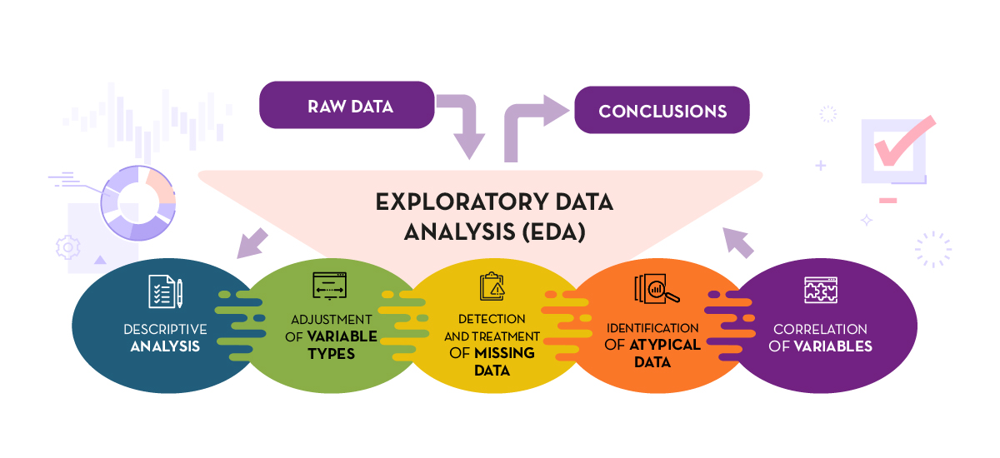

###1. **Data Preprocessing**:
   - Load the dataset
   - Check for missing values and handle them appropriately
   - Convert data types if necessary (e.g., string to datetime for release dates)
   - Create a new column called "preprocessed summary" where you perform the following steps and save the preprocessed summary in that column and later use it for the finetuning and analysis:
  *   Tokenize words
  *   Normalize text
  *   Remove punctuations
  *   Remove stopwords
  *   Removing HTML tags or markup
  *   Lemmatizing or stemming words
  *   Removing numbers or special characters
  *   Removing or replacing non-ASCII characters



In [4]:
dataset_path = 'persianmovies.csv'
movie_df = pd.read_csv(dataset_path)

print(movie_df.shape)
movie_df.head()

(1437, 10)


,Link,EN_title,PENGLISH_title,PERSIAN_title,Content_1,Content_2,Score,Year,Genre,Time
0,https://www.imvbox.com/watch-persian-movie-ira...,Local Anaesthetic,Bi Hessie Mozeie,بی‌حسی موضعی,جلال‌، دانشجوی سابق رشته فلسفه، متوجه می‌شود خ...,"Jalal, a dropouts philosophy student, realizes...",4.8,2018,Drama,73
1,https://www.imvbox.com/watch-persian-movie-ira...,Disturbance,Ashoftegi,آشفته گی,«آشفته‌گی» رئالیستی و اجتماعی نیست. یک فیلم اس...,"After the murder of his rich twin brother, Bar...",3.8,2018,Crime,78
2,https://www.imvbox.com/watch-persian-movie-ira...,Highlight,Haylayt,هایلایت,یک تصادف اتومبیل آدم‌هایی را در تقابل با هم قر...,A man and a woman are have a car accident and ...,4.4,2017,Drama,77
3,https://www.imvbox.com/watch-persian-movie-ira...,Gilda,Geelda,گیلدا,گیلدا ماجرای زنی به نام «گیلدا» را روایت می کن...,Gilda who owns a restaurant has a terrible nig...,3.8,2018,Drama,79
4,https://www.imvbox.com/watch-persian-movie-ira...,Atmosphere Station,Istgahe Atmosfer,ایستگاه اتمسفر,این فیلم روایت گر داستان زندگی زوج جوانی به اس...,Vahid and Marjan are a young couple who have g...,5.6,2017,Drama,85


In [5]:
movie_df["Score"].unique()

array([ 4.8,  3.8,  4.4,  5.6,  5.2,  3.1,  5.5,  4.5,  4.1,  4. ,  4.7,
        3.5,  5.1,  5.8,  5.3,  3.6,  3.9,  6.2,  8. ,  5. ,  6.6,  4.6,
        4.3,  5.7,  7.6,  6.9,  6.3,  4.9,  2.6,  7.5,  3.3,  6.8,  7.9,
        8.1,  8.5,  6.4,  8.3,  7.3,  6.1,  7.7,  4.2,  7.2,  0. ,  6.5,
        8.7,  8.6,  7.1,  5.9,  6.7,  6. ,  8.2,  7. ,  5.4,  3. ,  7.8,
        7.4,  8.4,  3.2,  2.8,  2.9,  2. ,  3.7,  9. ,  9.3,  9.4,  8.9,
        3.4,  9.6,  8.8,  2.7,  2.5, 10. ,  9.5,  9.2,  1.9])

In [6]:
movie_df["Year"].unique()

array([2018, 2017, 2020, 2016, 2019, 2015, 2012, 2013, 2009, 2011, 2010,
       1983, 2014, 2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000,
       1999, 1998, 1996, 1994, 1989, 1987, 1988,    0, 1997, 1995, 1993,
       1992, 1991, 1990, 1986, 1985, 1984, 1982, 1981, 1980, 1979, 1978,
       1975, 1974, 1972, 1971, 1969, 1968])

In [7]:
count = movie_df["Year"].value_counts()
print(count)

Year
2017    103
2015     98
2014     83
2000     83
2016     83
2011     79
2012     75
2008     67
2010     63
2018     63
2013     59
2009     56
2006     42
2007     41
2005     41
2003     35
2002     29
1998     24
2004     23
1995     23
1997     22
2019     21
1992     19
1999     19
1991     18
1994     17
1996     16
2001     16
1988     14
1993     14
1989     13
1987     13
1990     10
1985      8
1983      8
1986      8
2020      7
1984      6
1982      4
1980      2
1978      2
1975      2
0         1
1981      1
1979      1
1974      1
1972      1
1971      1
1969      1
1968      1
Name: count, dtype: int64


In [8]:
movie_df["Year"] = movie_df["Year"].replace([0], 2006)
movie_df["Year"].unique()

array([2018, 2017, 2020, 2016, 2019, 2015, 2012, 2013, 2009, 2011, 2010,
       1983, 2014, 2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000,
       1999, 1998, 1996, 1994, 1989, 1987, 1988, 1997, 1995, 1993, 1992,
       1991, 1990, 1986, 1985, 1984, 1982, 1981, 1980, 1979, 1978, 1975,
       1974, 1972, 1971, 1969, 1968])

In [9]:
movie_df["Time"].unique()

array(['73', '78', '77', '79', '85', '84', '80', '88', '96', '83', '106',
       '92', '97', '86', '98', '81', '90', '93', '75', '91', '102', '100',
       '74', '87', '82', '89', '104', '94', '105', '103', '113', '114',
       '101', '72', '121', '130', '111', '107', '109', '108', '110',
       '115', '60', '99', '95', '67', '116', '120', '148', '112', '68',
       '70', '142', nan, '65', '76', '158', 'Genre: \nDrama, Romance\n',
       '117', '49', '57', '52', '66', '69', '119', '178', '140', '51',
       '160', '50', '17', '40', '164', '53', '123', '25', '41', '59',
       '124', '28', '20', '56', '21', '18', '31', '7', '26', '36', '22',
       '30', '38', '35', '54', '27', '71', '37', '16', '29', '45', '133',
       '122', '۸۷', '42', '34', '64', '137', '15', '48', '44', '19', '12',
       '32', '33', '144', '23', '153'], dtype=object)

In [10]:
count = movie_df["Time"].value_counts()
print(count)

Time
90     162
83      55
92      53
100     50
93      48
      ... 
69       1
178      1
140      1
22       1
153      1
Name: count, Length: 115, dtype: int64


In [11]:
movie_df["Time"].fillna('90', inplace=True)
movie_df["Time"] = movie_df["Time"].replace(['Genre: \nDrama, Romance\n'], '90')
movie_df["Time"] = movie_df["Time"].replace(['۸۷'], '87')
movie_df["Time"] = movie_df["Time"].astype(int)
movie_df["Time"].unique()

array([ 73,  78,  77,  79,  85,  84,  80,  88,  96,  83, 106,  92,  97,
        86,  98,  81,  90,  93,  75,  91, 102, 100,  74,  87,  82,  89,
       104,  94, 105, 103, 113, 114, 101,  72, 121, 130, 111, 107, 109,
       108, 110, 115,  60,  99,  95,  67, 116, 120, 148, 112,  68,  70,
       142,  65,  76, 158, 117,  49,  57,  52,  66,  69, 119, 178, 140,
        51, 160,  50,  17,  40, 164,  53, 123,  25,  41,  59, 124,  28,
        20,  56,  21,  18,  31,   7,  26,  36,  22,  30,  38,  35,  54,
        27,  71,  37,  16,  29,  45, 133, 122,  42,  34,  64, 137,  15,
        48,  44,  19,  12,  32,  33, 144,  23, 153])

In [12]:
genres = movie_df["Genre"].unique()
for genre in genres:
    nan_count = movie_df[movie_df["Genre"] == genre]['Content_1'].isna().sum()
    count_genre = len(movie_df[movie_df["Genre"] == genre])
    if (nan_count == count_genre):
        movie_df = movie_df[movie_df["Genre"] != genre]

In [13]:
nan_count = movie_df["Content_1"].isna().sum()
print(f"Number of NaN values in column Content_1: {nan_count}")
nan_count = movie_df["Content_2"].isna().sum()
print(f"Number of NaN values in column Content_2: {nan_count}")

Number of NaN values in column Content_1: 345
Number of NaN values in column Content_2: 206


In [14]:
movie_df['Content_1'].fillna('', inplace=True)
movie_df['Content_2'].fillna('', inplace=True)

In [15]:
print(movie_df.shape)
movie_df.head()

(1421, 10)


,Link,EN_title,PENGLISH_title,PERSIAN_title,Content_1,Content_2,Score,Year,Genre,Time
0,https://www.imvbox.com/watch-persian-movie-ira...,Local Anaesthetic,Bi Hessie Mozeie,بی‌حسی موضعی,جلال‌، دانشجوی سابق رشته فلسفه، متوجه می‌شود خ...,"Jalal, a dropouts philosophy student, realizes...",4.8,2018,Drama,73
1,https://www.imvbox.com/watch-persian-movie-ira...,Disturbance,Ashoftegi,آشفته گی,«آشفته‌گی» رئالیستی و اجتماعی نیست. یک فیلم اس...,"After the murder of his rich twin brother, Bar...",3.8,2018,Crime,78
2,https://www.imvbox.com/watch-persian-movie-ira...,Highlight,Haylayt,هایلایت,یک تصادف اتومبیل آدم‌هایی را در تقابل با هم قر...,A man and a woman are have a car accident and ...,4.4,2017,Drama,77
3,https://www.imvbox.com/watch-persian-movie-ira...,Gilda,Geelda,گیلدا,گیلدا ماجرای زنی به نام «گیلدا» را روایت می کن...,Gilda who owns a restaurant has a terrible nig...,3.8,2018,Drama,79
4,https://www.imvbox.com/watch-persian-movie-ira...,Atmosphere Station,Istgahe Atmosfer,ایستگاه اتمسفر,این فیلم روایت گر داستان زندگی زوج جوانی به اس...,Vahid and Marjan are a young couple who have g...,5.6,2017,Drama,85


In [ ]:
# print(movie_df['Content_2'][0])
# nlp = spacy.load('en_core_web_sm')
# doc = nlp(movie_df['Content_2'][0])
# #print(doc)
# lemmatized_words = [token.lemma_ for token in doc]
# text = ' '.join(lemmatized_words)
# print(text)
# text = re.sub(r'[^\w\s]', '', text)
# print(text)
# text = word_tokenize(text)
# print(text)
# #stopwords = set(stopwords.words('english'))
# words = [word for word in text if not word in stopwords]
# print(' '.join(words))

Jalal, a dropouts philosophy student, realizes that her sister Mary, who has a Bipolar disease, is married to a bourgeois man named Shahrokh who is addicted to football betting. He left the house angrily, and goes to his friend's house, Bahman, who is an underground composer. He meets a strange taxi driver named Nasser on his way. They spent a strange night together.
Jalal , a dropout philosophy student , realize that her sister Mary , who have a bipolar disease , be married to a bourgeois man name Shahrokh who be addicted to football betting . he leave the house angrily , and go to his friend 's house , Bahman , who be an underground composer . he meet a strange taxi driver name Nasser on his way . they spend a strange night together .
Jalal  a dropout philosophy student  realize that her sister Mary  who have a bipolar disease  be married to a bourgeois man name Shahrokh who be addicted to football betting  he leave the house angrily  and go to his friend s house  Bahman  who be an u

In [16]:
class Englsih_Preprocessor:
    """
    A class for preprocessing text data.

    Attributes:
        stopwords (set): A set of stopwords to be removed from the text.
        nlp (spacy.lang.en.English): A SpaCy English language model for text normalization.

    Methods:
        preprocess(text): Performs preprocessing steps on the given text.
        normalize(text): Normalizes the given text by converting it to lowercase and lemmatizing the words.
        remove_punctuations(text): Removes punctuation from the given text.
        word_tokenize(text): Tokenizes the given text into individual words.
        remove_stopwords(words): Removes stopwords from the given list of words.
        **ADD MORE METHODS**
    """

    def __init__(self):
        """
        Initializes the Preprocessor object.

        TODO: Load the set of stopwords for the English language.
        TODO: Load the SpaCy English language model for text normalization.
        """

        self.stopwords = set(stopwords.words('english'))
        self.nlp = spacy.load('en_core_web_sm')

        pass

    def preprocess(self, text):
        """
        Preprocesses the given text by performing normalization, punctuation removal, word tokenization, and stopword removal.

        Args:
            text (str): The input text to be preprocessed.

        Returns:
            str: The preprocessed text.

        TODO: Implement the preprocess method by calling the respective helper methods in the correct order.
        """

        normalized_text = self.normalize(text)
        without_punctuations = self.remove_punctuations(normalized_text)
        tokenized_words = self.word_tokenize(without_punctuations)
        without_stopwords = self.remove_stopwords(tokenized_words)
        return ' '.join(without_stopwords)

        pass

    def normalize(self, text):
        """
        Normalizes the given text by converting it to lowercase and lemmatizing the words.

        Args:
            text (str): The input text to be normalized.

        Returns:
            str: The normalized text.

        TODO: Implement the normalize method using the SpaCy language model to lemmatize the words.
        """
        doc = self.nlp(text)
        lemmatized_words = [token.lemma_ for token in doc]
        return ' '.join(lemmatized_words)

        pass

    def remove_punctuations(self, text):
        """
        Removes punctuation from the given text.

        Args:
            text (str): The input text from which punctuation needs to be removed.

        Returns:
            str: The text with punctuation removed.

        TODO: Implement the remove_punctuations method using regular expressions.
        """

        return re.sub(r'[^\w\s]', '', text)

        pass

    def word_tokenize(self, text):
        """
        Tokenizes the given text into individual words.

        Args:
            text (str): The input text to be tokenized.

        Returns:
            list: A list of tokens (words) in the text.

        TODO: Implement the word_tokenize method using the NLTK word_tokenize function.
        """
        return word_tokenize(text)

        pass

    def remove_stopwords(self, words):
        """
        Removes stopwords from the given list of words.

        Args:
            words (list): A list of words from which stopwords need to be removed.

        Returns:
            list: A list of words with stopwords removed.

        TODO: Implement the remove_stopwords method by filtering out words present in the stopwords set.
        """

        return [word for word in words if not word in self.stopwords]

        pass

In [17]:
# TODO: Apply the preprocess method of the Preprocessor object to the English Summary column of the DataFrame
# and store the preprocessed text in a new column named 'Preprocessed English'.
# TODO: Display the updated DataFrame with the new 'Preprocessed English' column.

preprocessor = Englsih_Preprocessor()
movie_df['Preprocessed English'] = movie_df['Content_2'].apply(preprocessor.preprocess)

movie_df.head()

,Link,EN_title,PENGLISH_title,PERSIAN_title,Content_1,Content_2,Score,Year,Genre,Time,Preprocessed English
0,https://www.imvbox.com/watch-persian-movie-ira...,Local Anaesthetic,Bi Hessie Mozeie,بی‌حسی موضعی,جلال‌، دانشجوی سابق رشته فلسفه، متوجه می‌شود خ...,"Jalal, a dropouts philosophy student, realizes...",4.8,2018,Drama,73,Jalal dropout philosophy student realize siste...
1,https://www.imvbox.com/watch-persian-movie-ira...,Disturbance,Ashoftegi,آشفته گی,«آشفته‌گی» رئالیستی و اجتماعی نیست. یک فیلم اس...,"After the murder of his rich twin brother, Bar...",3.8,2018,Crime,78,murder rich twin brother Barbod assume identit...
2,https://www.imvbox.com/watch-persian-movie-ira...,Highlight,Haylayt,هایلایت,یک تصادف اتومبیل آدم‌هایی را در تقابل با هم قر...,A man and a woman are have a car accident and ...,4.4,2017,Drama,77,man woman car accident go coma spouse know two...
3,https://www.imvbox.com/watch-persian-movie-ira...,Gilda,Geelda,گیلدا,گیلدا ماجرای زنی به نام «گیلدا» را روایت می کن...,Gilda who owns a restaurant has a terrible nig...,3.8,2018,Drama,79,Gilda restaurant terrible night till morning s...
4,https://www.imvbox.com/watch-persian-movie-ira...,Atmosphere Station,Istgahe Atmosfer,ایستگاه اتمسفر,این فیلم روایت گر داستان زندگی زوج جوانی به اس...,Vahid and Marjan are a young couple who have g...,5.6,2017,Drama,85,Vahid Marjan young couple get divorce month ag...


In [ ]:
# from hazm import Normalizer, word_tokenize, stopwords_list
# normalizer = Normalizer()
# stopwords = set(stopwords_list())

# print(movie_df['Content_1'][0])
# text_without_punctuations = re.sub(r'[^\w\s]', '', movie_df['Content_1'][0])
# print(text_without_punctuations)

# normalized_text = normalizer.normalize(text_without_punctuations)
# print(normalized_text)

# tokenized_words = word_tokenize(normalized_text)
# print(tokenized_words)

# filtered_words = [word for word in tokenized_words if word not in stopwords]
# print(filtered_words)

# preprocessed_text = ' '.join(filtered_words)
# print(preprocessed_text)


جلال‌، دانشجوی سابق رشته فلسفه، متوجه می‌شود خواهرش که به اختلال روانی دوقطبی مبتلاست، با مردی ثروتمند به نام شاهرخ ازدواج کرده که به شرط‌‌بندی بازی فوتبال اعتیاد دارد. جلال با عصبانیت از خانه بیرون می‌زند تا به خانه دوستش، بهمن، برود که یک آهنگ‌ساز زیرزمینی است. در مسیر جلال با یک راننده تاکسی به نام ناصر آشنا می‌شود و این دو شب عجیبی را در کنار هم سپری می‌کنند.
جلال دانشجوی سابق رشته فلسفه متوجه میشود خواهرش که به اختلال روانی دوقطبی مبتلاست با مردی ثروتمند به نام شاهرخ ازدواج کرده که به شرطبندی بازی فوتبال اعتیاد دارد جلال با عصبانیت از خانه بیرون میزند تا به خانه دوستش بهمن برود که یک آهنگساز زیرزمینی است در مسیر جلال با یک راننده تاکسی به نام ناصر آشنا میشود و این دو شب عجیبی را در کنار هم سپری میکنند
جلال دانشجوی سابق رشته فلسفه متوجه می‌شود خواهرش که به اختلال روانی دوقطبی مبتلاست با مردی ثروتمند به نام شاهرخ ازدواج‌کرده که به شرطبندی بازی فوتبال اعتیاد دارد جلال با عصبانیت از خانه بیرون می‌زند تا به خانه دوستش بهمن برود که یک آهنگساز زیرزمینی است در مسیر جلال با یک راننده تاکسی

In [18]:
from hazm import Normalizer, word_tokenize, stopwords_list

# TODO: Initialize the HAZM Normalizer
# TODO: Load the Persian stopwords list
# TODO: Load desired functions from HAZM (or any other library)
def persian_preprocess_text(text):
    """
    Preprocesses the given Persian text by performing normalization, punctuation removal, word tokenization, and stopword removal.

    Args:
        text (str): The input Persian text to be preprocessed.

    Returns:
        str: The preprocessed Persian text.

    TODO: Implement the following steps:
    1. Remove punctuations from the text using regular expressions.
    2. Normalize the text using the HAZM Normalizer.
    3. Tokenize the normalized text using the HAZM word_tokenize function.
    4. Remove stopwords from the tokenized text using the loaded stopwords list.
    5. Join the remaining tokens back into a string.
    6. ... (what other preprocessing methods you want to have)
    """

    normalizer = Normalizer()
    stopwords = set(stopwords_list())

    text_without_punctuations = re.sub(r'[^\w\s]', '', text)

    normalized_text = normalizer.normalize(text_without_punctuations)

    tokenized_words = word_tokenize(normalized_text)

    filtered_words = [word for word in tokenized_words if word not in stopwords]

    preprocessed_text = ' '.join(filtered_words)

    return preprocessed_text

    pass

# TODO: Apply the persian_preprocess_text function to the Persian Summary column of the DataFrame
# and store the preprocessed text in a new column named 'Preprocessed Persian'.
# TODO: Display the updated DataFrame with the new 'Preprocessed Persian' column.

movie_df['Preprocessed Persian'] = movie_df['Content_1'].apply(persian_preprocess_text)

movie_df.head()


,Link,EN_title,PENGLISH_title,PERSIAN_title,Content_1,Content_2,Score,Year,Genre,Time,Preprocessed English,Preprocessed Persian
0,https://www.imvbox.com/watch-persian-movie-ira...,Local Anaesthetic,Bi Hessie Mozeie,بی‌حسی موضعی,جلال‌، دانشجوی سابق رشته فلسفه، متوجه می‌شود خ...,"Jalal, a dropouts philosophy student, realizes...",4.8,2018,Drama,73,Jalal dropout philosophy student realize siste...,جلال دانشجوی سابق رشته فلسفه متوجه خواهرش اختل...
1,https://www.imvbox.com/watch-persian-movie-ira...,Disturbance,Ashoftegi,آشفته گی,«آشفته‌گی» رئالیستی و اجتماعی نیست. یک فیلم اس...,"After the murder of his rich twin brother, Bar...",3.8,2018,Crime,78,murder rich twin brother Barbod assume identit...,آشفتهگی رئالیستی اجتماعی فیلم عشق جنایت
2,https://www.imvbox.com/watch-persian-movie-ira...,Highlight,Haylayt,هایلایت,یک تصادف اتومبیل آدم‌هایی را در تقابل با هم قر...,A man and a woman are have a car accident and ...,4.4,2017,Drama,77,man woman car accident go coma spouse know two...,تصادف اتومبیل آدمهایی تقابل قرار مراقبت مصدومی...
3,https://www.imvbox.com/watch-persian-movie-ira...,Gilda,Geelda,گیلدا,گیلدا ماجرای زنی به نام «گیلدا» را روایت می کن...,Gilda who owns a restaurant has a terrible nig...,3.8,2018,Drama,79,Gilda restaurant terrible night till morning s...,گیلدا ماجرای زنی نام گیلدا روایت صاحب رستوانیس...
4,https://www.imvbox.com/watch-persian-movie-ira...,Atmosphere Station,Istgahe Atmosfer,ایستگاه اتمسفر,این فیلم روایت گر داستان زندگی زوج جوانی به اس...,Vahid and Marjan are a young couple who have g...,5.6,2017,Drama,85,Vahid Marjan young couple get divorce month ag...,فیلم روایت‌گر داستان زندگی زوج جوانی اسم مرجان...


In [19]:
movie_df.to_csv('df_1.csv', index=False)

### 2. **Descriptive Statistics**:
   - Calculate summary statistics (mean, median, mode, standard deviation, range) for numerical variables
   - Determine the count and frequency of unique values for categorical variables

In [20]:

# Feel free to add any desired methods to the class below this is a suggestion.

class DescriptiveStats:
    def __init__(self, df):
        self.df = df

    def calculate_summary_stats(self, numerical_cols):
        """
        Calculate summary statistics (mean, median, mode, standard deviation, range) for numerical variables.

        Args:
            numerical_cols (list): A list of column names containing numerical data.

        Returns:
            None (prints the summary statistics for each numerical column)

        TODO:
        1. Ensure that the specified columns are treated as numerical data types.
        2. Calculate and print the mean, median, mode, standard deviation, and range for each numerical column.
        """

        for col in numerical_cols:
                mean_val = self.df[col].mean()
                median_val = self.df[col].median()
                mode_val = self.df[col].mode().iloc[0]
                std_val = self.df[col].std()
                min_val = self.df[col].min()
                max_val = self.df[col].max()
                print(f"Column: {col}")
                print(f"Mean: {mean_val:.2f}")
                print(f"Median: {median_val:.2f}")
                print(f"Mode: {mode_val:.2f}")
                print(f"Standard Deviation: {std_val:.2f}")
                print(f"Range: ({min_val:.2f}, {max_val:.2f})")
                print()

        pass

    def count_unique_values(self, categorical_cols):
        """
        Determine the count and frequency of unique values for categorical variables.

        Args:
            categorical_cols (list): A list of column names containing categorical data.

        Returns:
            None (prints the count and frequency of unique values for each categorical column)

        TODO:
        1. Iterate through each categorical column.
        2. Calculate the count and frequency of unique values for each column.
        3. Print the unique values, their counts, and their frequencies.
        """

        for col in categorical_cols:
                unique_counts = self.df[col].value_counts()
                total_counts = unique_counts.sum()
                print(f"Column: {col}")
                print(unique_counts)
                print()
                print(f"Frequency (genre/total):")
                print(unique_counts / total_counts)
                print()

        pass

# Example usage
numerical_cols = ["Score", "Year", "Time" ]
categorical_cols = ["Genre"]

# Assuming you have a pandas DataFrame named 'df'
stats = DescriptiveStats(movie_df)

# TODO: Call the calculate_summary_stats method with the numerical_cols list
stats.calculate_summary_stats(numerical_cols)

# TODO: Call the count_unique_values method with the categorical_cols list
stats.count_unique_values(categorical_cols)

Column: Score
Mean: 6.53
Median: 6.80
Mode: 8.00
Standard Deviation: 1.57
Range: (0.00, 10.00)

Column: Year
Mean: 2007.23
Median: 2010.00
Mode: 2017.00
Standard Deviation: 9.36
Range: (1968.00, 2020.00)

Column: Time
Mean: 86.74
Median: 90.00
Mode: 90.00
Standard Deviation: 19.06
Range: (7.00, 178.00)

Column: Genre
Genre
Drama                       752
Comedy                      267
Action                       76
Crime                        67
Adventure                    48
Human Interest & Society     46
Arts & Literature            35
Family                       25
Culture & Traditions         24
War                          21
History                      18
Romance                      12
Mystery                       8
Horror                        7
Experimental                  7
Portrait                      5
Thriller                      2
Animation                     1
Name: count, dtype: int64

Frequency (genre/total):
Genre
Drama                       0.529205
Come

###3. **Data Visualization**:
   - Plot histograms or density plots for numerical variables
   - Create bar plots or pie charts for categorical variables
   - Generate scatter plots or correlation matrices to explore relationships

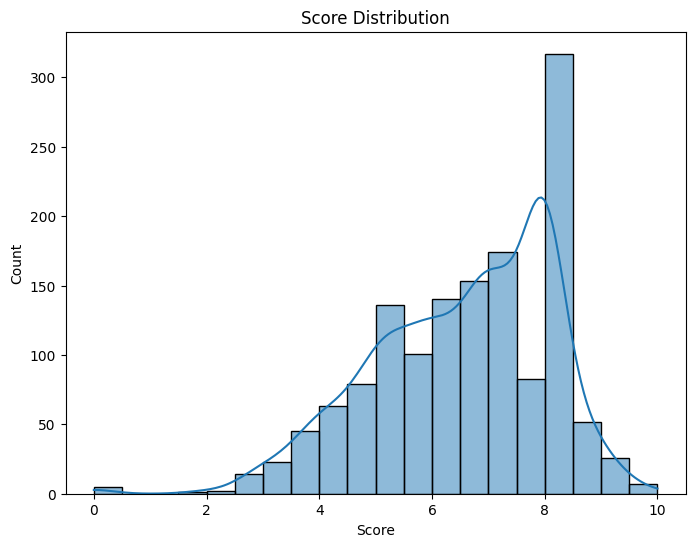

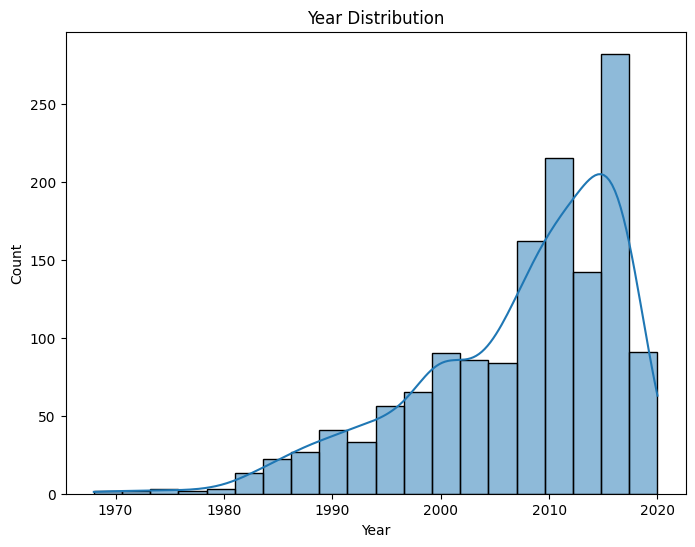

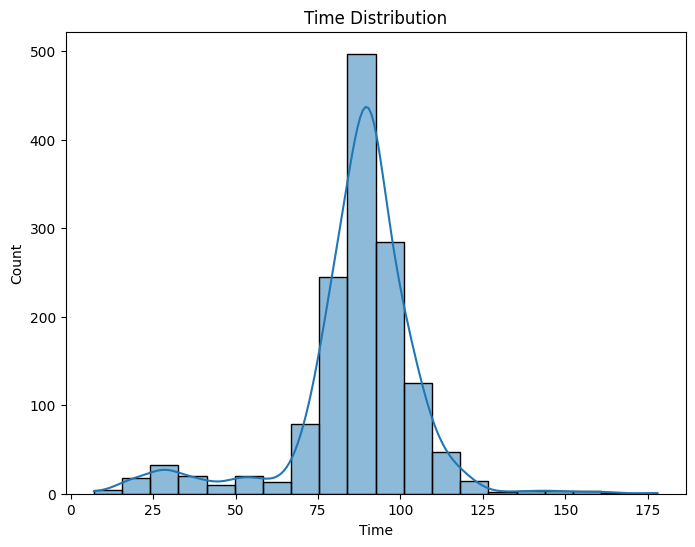

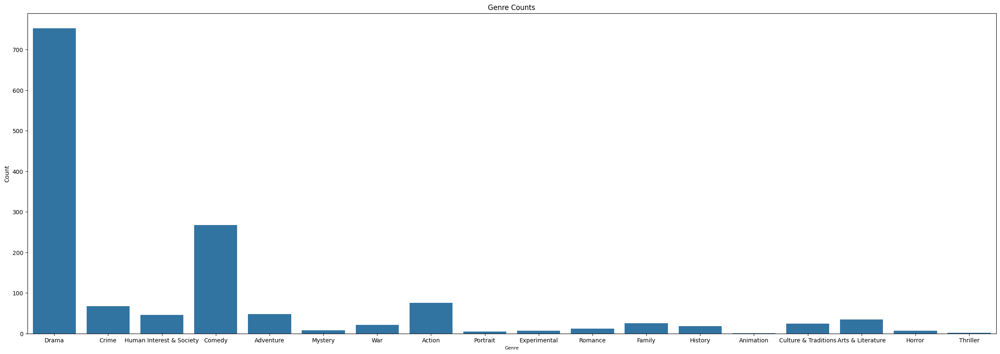

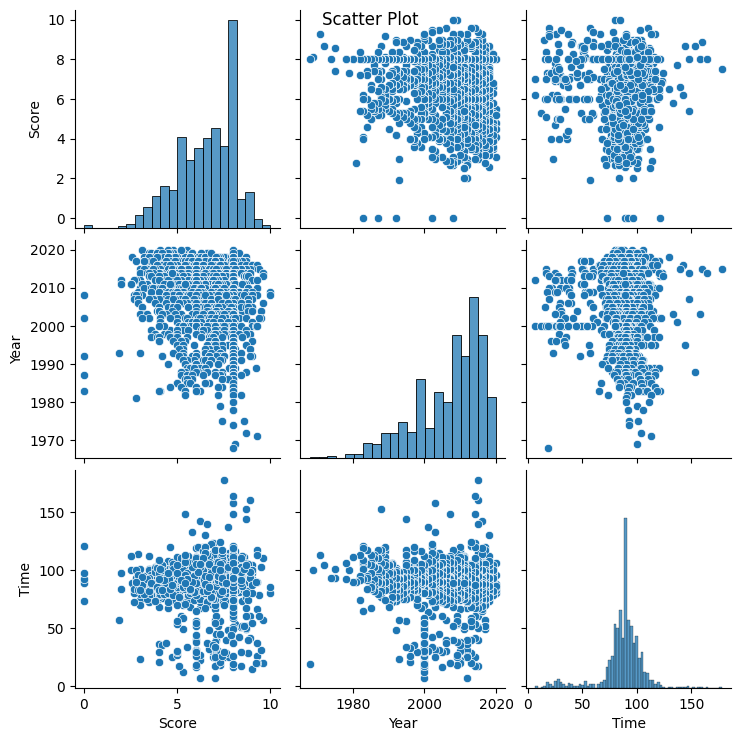

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Feel free to add any desired methods to the class below this is a suggestion.
# Have fun trying to visualize your data

class DataVisualization:
    def __init__(self, df):
        self.df = df

    def plot_histograms(self, numerical_cols):
        """
        Plot histograms or density plots for numerical variables.

        Args:
            numerical_cols (list): A list of column names containing numerical data.

        Returns:
            None (displays the plots)

        TODO:
        1. Iterate through each numerical column.
        2. Create a histogram or density plot for each column using Matplotlib or Seaborn.
        3. Set appropriate titles and labels for the plots.
        4. Display the plots.
        """

        for col in numerical_cols:
                plt.figure(figsize=(8, 6))
                sns.histplot(data=self.df, x=col, kde=True, bins=20)
                plt.title(f"{col} Distribution")
                plt.xlabel(col)
                plt.ylabel("Count")
                plt.show()
        pass

    def plot_categorical(self, categorical_cols):
        """
        Create bar plots or pie charts for categorical variables.

        Args:
            categorical_cols (list): A list of column names containing categorical data.

        Returns:
            None (displays the plots)

        TODO:
        1. Iterate through each categorical column.
        2. Create a bar plot or pie chart for each column using Matplotlib or Seaborn.
        3. Set appropriate titles and labels for the plots.
        4. Display the plots.
        """

        for col in categorical_cols:
                plt.figure(figsize=(30, 10))
                sns.countplot(data=self.df, x=col)
                plt.title(f"{col} Counts")
                plt.xlabel(col, fontsize=8)
                plt.ylabel("Count")
                plt.show()

        pass

    def plot_relationships(self, numerical_cols):
        """
        Generate scatter plots or correlation matrices to explore relationships between numerical variables.

        Args:
            numerical_cols (list): A list of column names containing numerical data.

        Returns:
            None (displays the plots)

        TODO:
        1. Create a scatter plot matrix or correlation matrix for the numerical columns using Matplotlib or Seaborn.
        2. Set appropriate titles and labels for the plots.
        3. Display the plots.
        """

        sns.pairplot(data=self.df[numerical_cols])
        plt.suptitle("Scatter Plot")
        plt.show()

        pass

# Example usage
numerical_cols = ["Score", "Year", "Time" ]
categorical_cols = ["Genre"]

# Assuming you have a pandas DataFrame named 'df'
viz = DataVisualization(movie_df)

# TODO: Call the plot_histograms method with the numerical_cols list
viz.plot_histograms(numerical_cols)

# TODO: Call the plot_categorical method with the categorical_cols list
viz.plot_categorical(categorical_cols)

# TODO: Call the plot_relationships method with the numerical_cols list
viz.plot_relationships(numerical_cols)

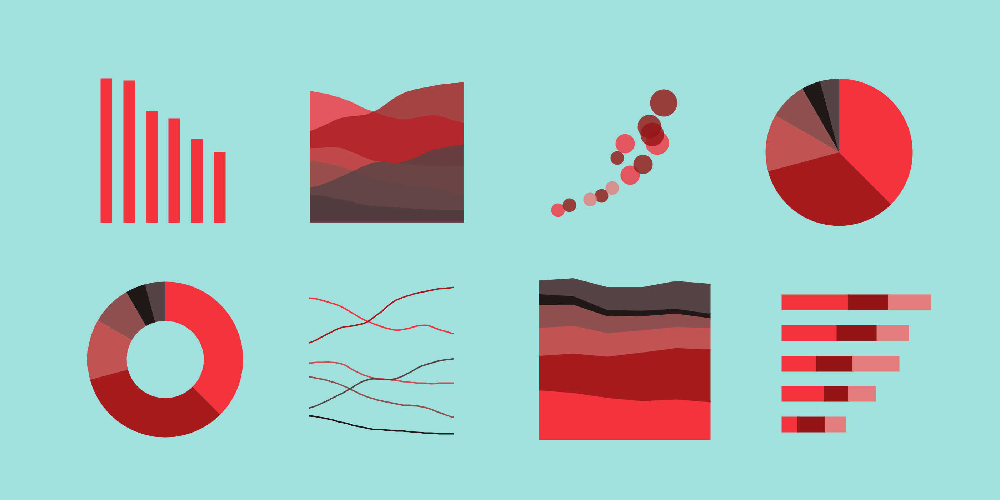

###4. **Genre Analysis**:
   - Create a word cloud or bar plot for genre distribution (you can use bidi library for persian text)
   - Obtain the 10 most frequently occurring words for each genre, based on both the initial summaries and the preprocessed summaries.
   - Analyze the distribution of movies across genres
   - Explore the relationship between genres and other variables

In [22]:
!pip install arabic_reshaper
from arabic_reshaper import reshape

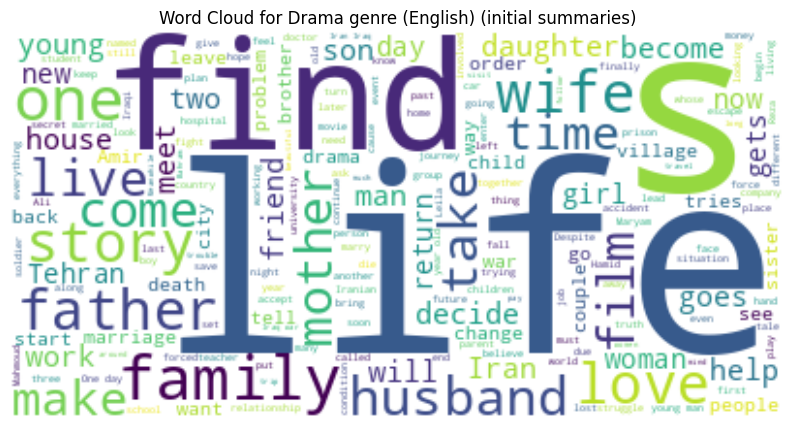

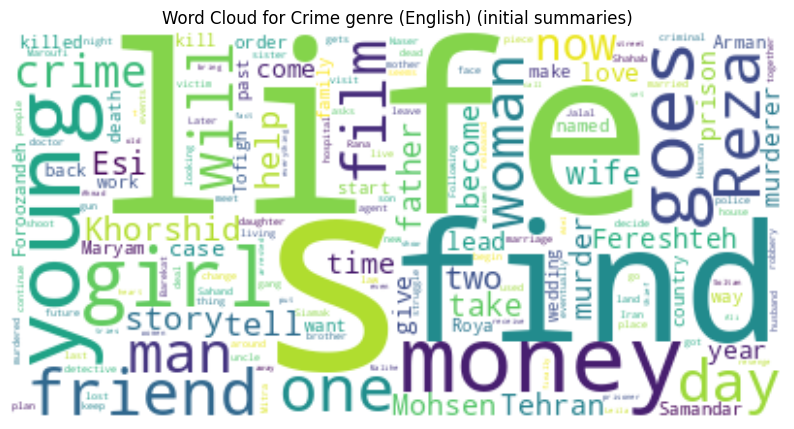

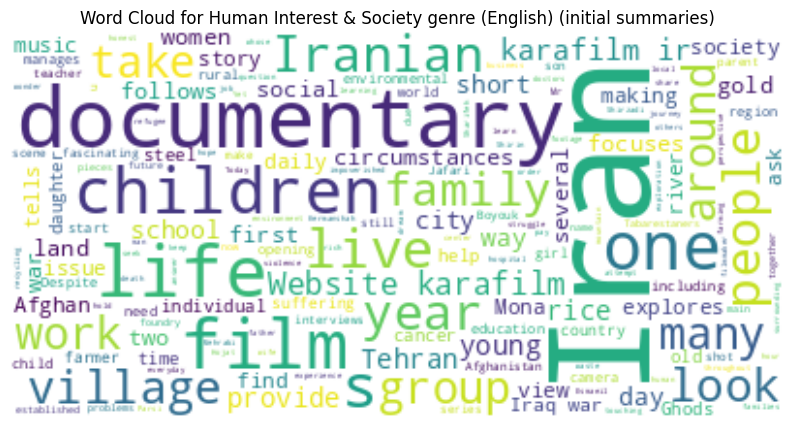

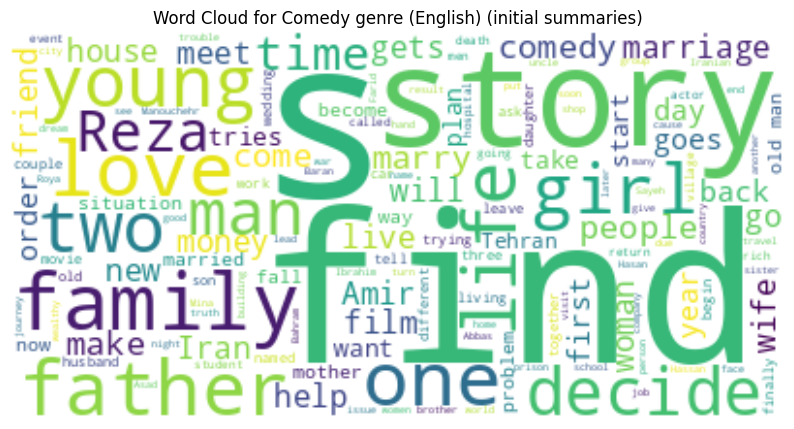

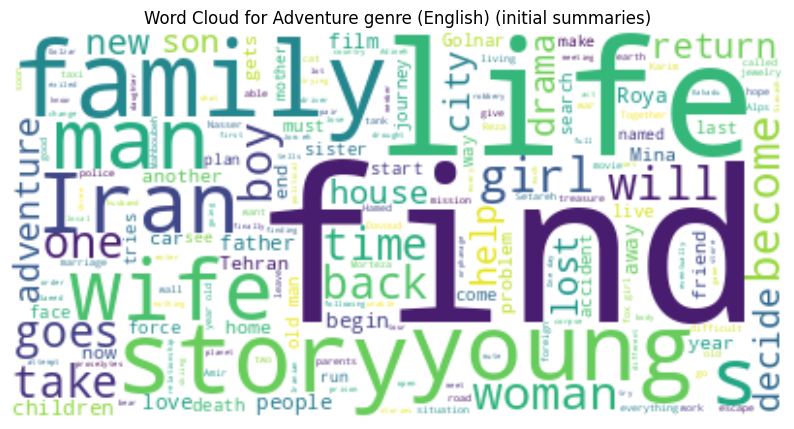

...

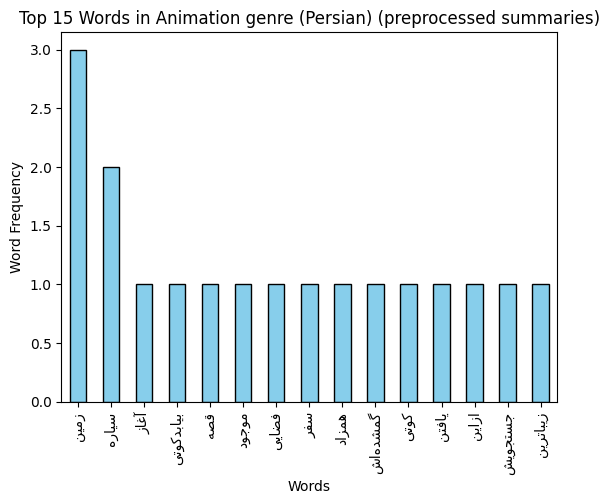

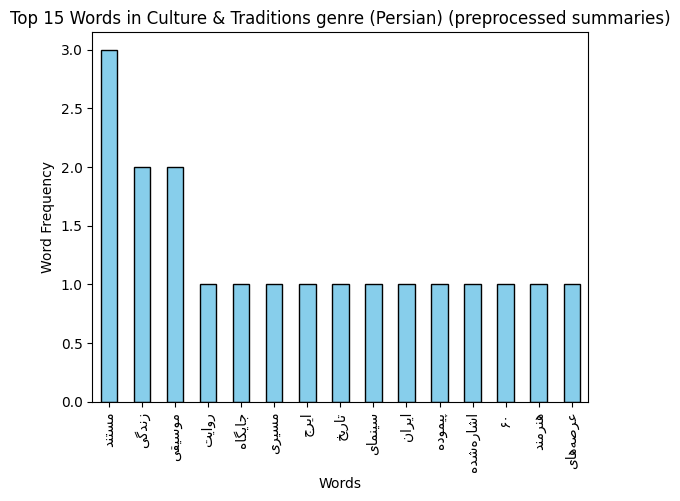

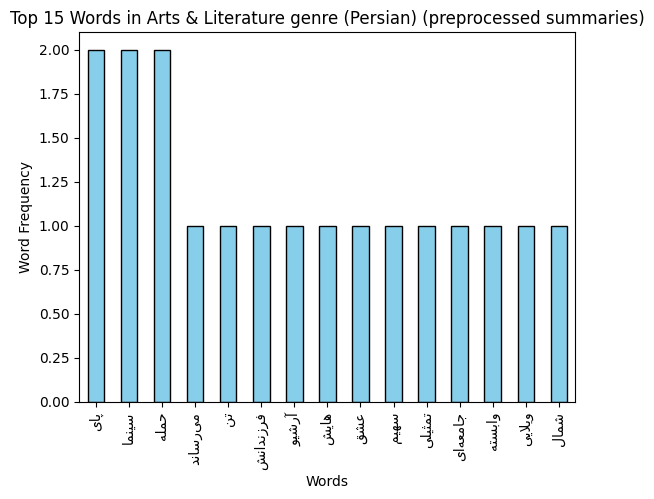

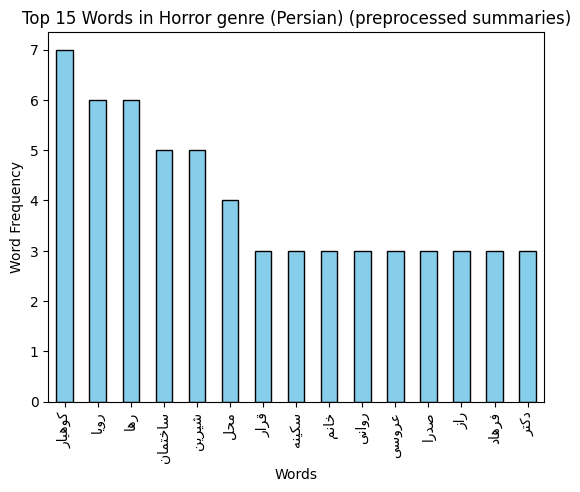

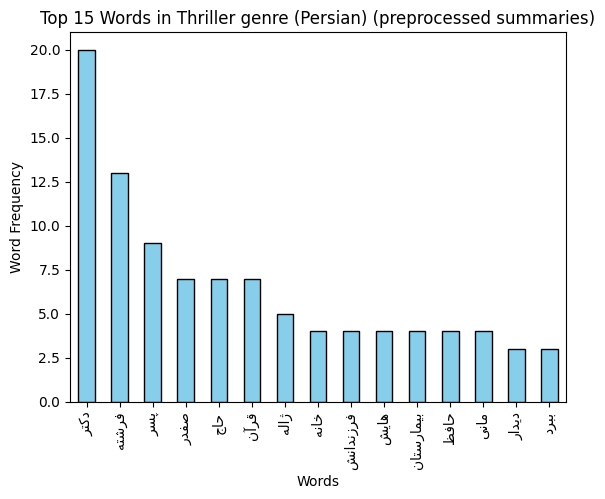

Top words for Drama genre in english (initial summaries): 
the    3589
to     2765
and    2575
a      2422
of     2032
is     1625
his    1403
in     1246
her    1094
he      744
Name: count, dtype: int64

Top words for Drama genre in english (preprocessed summaries): 
life      425
find      313
young     279
family    275
go        272
one       270
take      235
get       225
man       224
story     220
Name: count, dtype: int64

Top words for Crime genre in english (initial summaries): 
the    373
and    264
to     246
a      244
of     191
is     151
his    141
in     124
he     102
her     88
Name: count, dtype: int64

Top words for Crime genre in english (preprocessed summaries): 
life      37
find      36
get       33
go        33
friend    29
kill      23
woman     23
money     22
young     22
murder    21
Name: count, dtype: int64

Top words for Human Interest & Society genre in english (initial summaries): 
the      232
of       166
and      133
to       100
a         99
in 

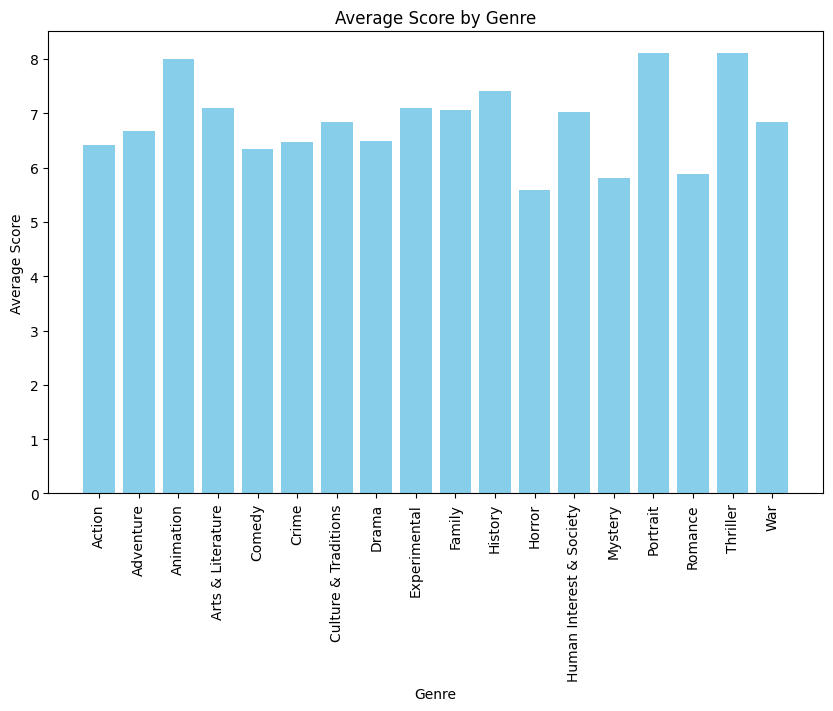

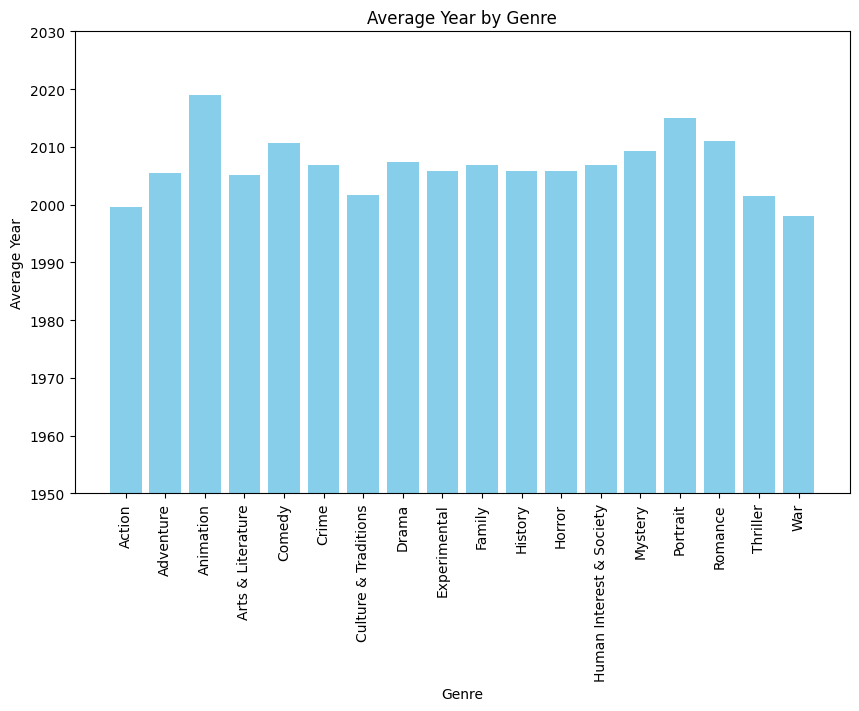

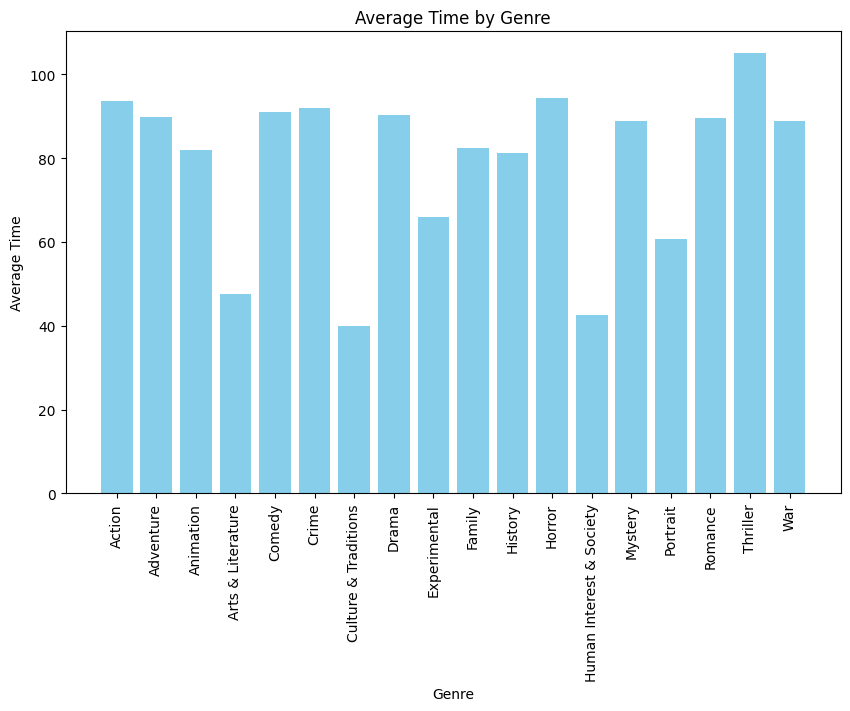

In [23]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from bidi import algorithm as bidi_algorithm

class GenreAnalysis:
    def __init__(self, df):
        self.df = df

    def visualize_genre_distribution(self, column):
        """
        Create a word cloud or bar plot for genre distribution.

        Args:
            column (str): The column name containing the genre information.

        Returns:
            None (displays the plot)

        TODO:
        1. Check if the data is in Persian or English.
        2. If the data is in Persian, use the bidi library to handle right-to-left text direction.
        3. Create a word cloud or bar plot for the genre distribution using Matplotlib or Seaborn.
        4. Set appropriate titles and labels for the plot.
        5. Display the plot.
        """

        genres = self.df[column].unique()
        for genre in genres:
            wc = WordCloud(background_color='white').generate(' '.join(self.df[self.df[column] == genre]['Content_2']))
            plt.figure(figsize=(10, 6))
            plt.imshow(wc, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Word Cloud for {genre} genre (English) (initial summaries)')
            plt.show()

        for genre in genres:
            wc = WordCloud(background_color='white').generate(' '.join(self.df[self.df[column] == genre]['Preprocessed English']))
            plt.figure(figsize=(10, 6))
            plt.imshow(wc, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Word Cloud for {genre} genre (English) (preprocessed summaries)')
            plt.show()


        for genre in genres:
            genre_text = bidi_algorithm.get_display(reshape(self.df[self.df[column] == genre]['Content_1'].str.cat(sep=' ')))
            ax = pd.Series(genre_text.split()).value_counts()[:15].plot(kind='bar', color='skyblue', edgecolor='black')
            ax.set_xlabel("Words")
            ax.set_ylabel("Word Frequency")
            ax.set_title(f"Top 15 Words in {genre} genre (Persian) (initial summaries)")

            plt.show()

        for genre in genres:
            genre_text = bidi_algorithm.get_display(reshape(self.df[self.df[column] == genre]['Preprocessed Persian'].str.cat(sep=' ')))
            ax = pd.Series(genre_text.split()).value_counts()[:15].plot(kind='bar', color='skyblue', edgecolor='black')
            ax.set_xlabel("Words")
            ax.set_ylabel("Word Frequency")
            ax.set_title(f"Top 15 Words in {genre} genre (Persian) (preprocessed summaries)")

            plt.show()

        pass

    def frequent_words_by_genre(self, genre_column):
        """
        Obtain the 10 most frequently occurring words for each genre, based on both the initial summaries and the preprocessed summaries.

        Args:
            content_column (str): The column name containing the text data.
            genre_column (str): The column name containing the genre information.

        Returns:
            None (prints the top 10 most frequent words for each genre)

        TODO:
        1. Group the data by genre.
        2. For each genre:
            a. Get the top 10 most frequent words from the initial summaries.
            b. Get the top 10 most frequent words from the preprocessed summaries (if available).
            c. Print the top 10 frequent words for both cases.
        """


        genres = self.df[genre_column].unique()
        for genre in genres:
            top_words_initial_English = pd.Series(' '.join(self.df[self.df[genre_column] == genre]['Content_2']).split()).value_counts()[:10]
            top_words_Preprocessed_English = pd.Series(' '.join(self.df[self.df[genre_column] == genre]['Preprocessed English']).split()).value_counts()[:10]
            print(f'Top words for {genre} genre in english (initial summaries): \n{top_words_initial_English}\n')
            print(f'Top words for {genre} genre in english (preprocessed summaries): \n{top_words_Preprocessed_English}\n')

        for genre in genres:
            top_words_initial_Persian = pd.Series(' '.join(self.df[self.df[genre_column] == genre]['Content_1']).split()).value_counts()[:10]
            top_words_Preprocessed_Persian = pd.Series(' '.join(self.df[self.df[genre_column] == genre]['Preprocessed Persian']).split()).value_counts()[:10]
            print(f'Top words for {genre} genre in persian (initial summaries): \n{top_words_initial_Persian}\n')
            print(f'Top words for {genre} genre in persian (preprocessed summaries): \n{top_words_Preprocessed_Persian}\n')

        pass

    def analyze_genre_distribution(self, genre_column):
        """
        Analyze the distribution of movies across genres.

        Args:
            genre_column (str): The column name containing the genre information.

        Returns:
            None (prints the analysis of genre distribution)

        TODO:
        1. Calculate the count of movies for each genre.
        2. Determine the most and least popular genres based on the movie count.
        3. Print the analysis of genre distribution, including the most and least popular genres.
        """
        genre_counts = self.df[genre_column].value_counts()

        most_popular_genre = genre_counts.idxmax()
        most_popular_count = genre_counts.max()

        least_popular_genre = genre_counts.idxmin()
        least_popular_count = genre_counts.min()

        print("Genre Distribution:")
        print(genre_counts)
        print(f"Most Popular Genre: {most_popular_genre} ({most_popular_count} movies)")
        print(f"Least Popular Genre: {least_popular_genre} ({least_popular_count} movies)")
        pass

    def explore_genre_relationships(self, genre_column, other_columns):
        """
        Explore the relationship between genres and other variables.

        Args:
            genre_column (str): The column name containing the genre information.
            other_columns (list): A list of column names to explore relationships with.

        Returns:
            None (displays plots or prints analysis)

        TODO:
        1. Iterate through each column in other_columns.
        2. Generate appropriate plots or calculations to explore the relationship between genres and the selected column.
        3. Set appropriate titles and labels for the plots.
        4. Display the plots or print the analysis.
        """
        for col in other_columns:
                genre_avg_rating = self.df.groupby(genre_column)[col].mean()
                plt.figure(figsize=(10, 6))
                plt.bar(genre_avg_rating.index, genre_avg_rating.values, color='skyblue')
                plt.xlabel(genre_column)
                plt.ylabel(f"Average {col}")
                plt.title(f"Average {col} by Genre")
                plt.xticks(rotation=90)
                if (col == "Year"):
                    plt.ylim(bottom=1950, top=2030)
                plt.show()
        pass


genre_analysis = GenreAnalysis(movie_df)
genre_column = 'Genre'
other_columns = ["Score", "Year", "Time" ]

# TODO: Call the visualize_genre_distribution method with the genre_column
genre_analysis.visualize_genre_distribution(genre_column)

# TODO: Call the frequent_words_by_genre method with the content_column and genre_column
genre_analysis.frequent_words_by_genre(genre_column)

# TODO: Call the analyze_genre_distribution method with the genre_column
genre_analysis.analyze_genre_distribution(genre_column)

# TODO: Call the explore_genre_relationships method with the genre_column and other_columns
genre_analysis.explore_genre_relationships(genre_column, other_columns)

In one paragraph, briefly explain what you found interesting in your analysis and whether this analysis prompted you to take any further steps; if so, explain those additional steps.



از نکاتی که از مقایسه کلمات قبل و بعد از فرایند پراسس جلمات می توان فهمید، این است که بسیاری از کلمات پر تکرار در هر دو زبان مربوط به حروف اضافه هستند. و بعد از فرایند پراسس، این کلمات به درستی حذف شده اند که نشان می دهد این فرایند به خوبی انجام شده است. هم چنین، با نگاه کردن به کلمات پرتکرار هر ژانر، تا حدی می توان تشخیص داد که وجود یک سری کلمات نشان دهنده آن ژانر است. به طور مثال در ژانر جنایی کلمه زندان و یا در ژانر جنگ کلمه جنگ بیشترین تکرار را داشته است که نشان می دهد بر اساس کلمات استفاده شده، می توان تحلیل مربوط به ژانر را تا حد خوبی انجام داد. هر چند در ادامه از این روش برای تحلیل استفاده نشده است.

###5. **Time-based Analysis**:
   - Plot line or bar charts for movie releases over time
   - Investigate trends or patterns in movie releases
   - Analyze the relationship between release year and other variables

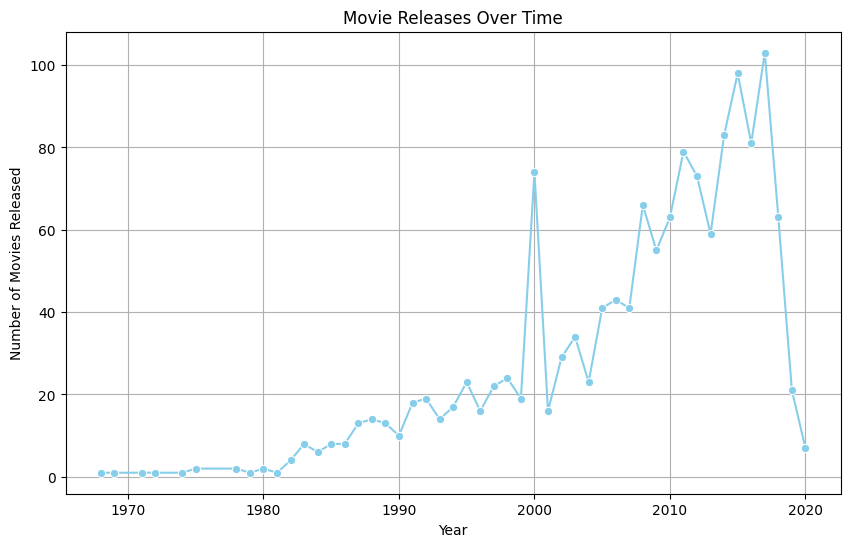

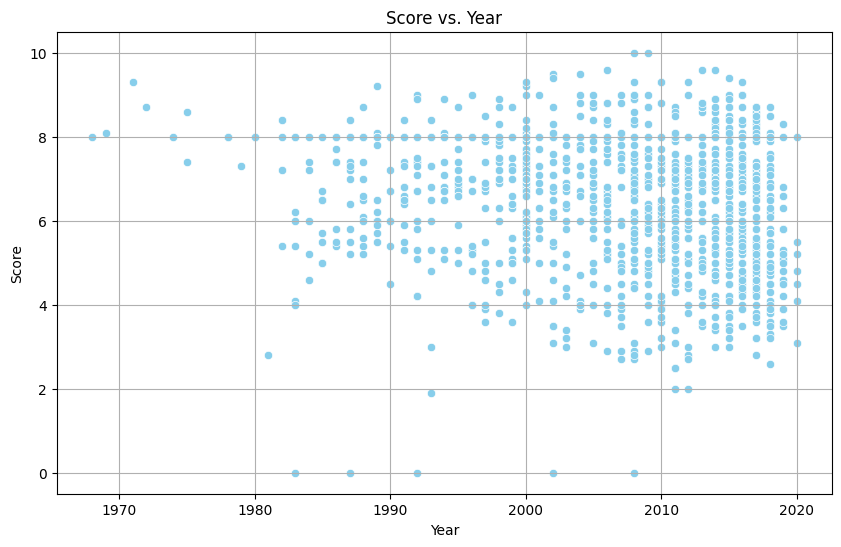

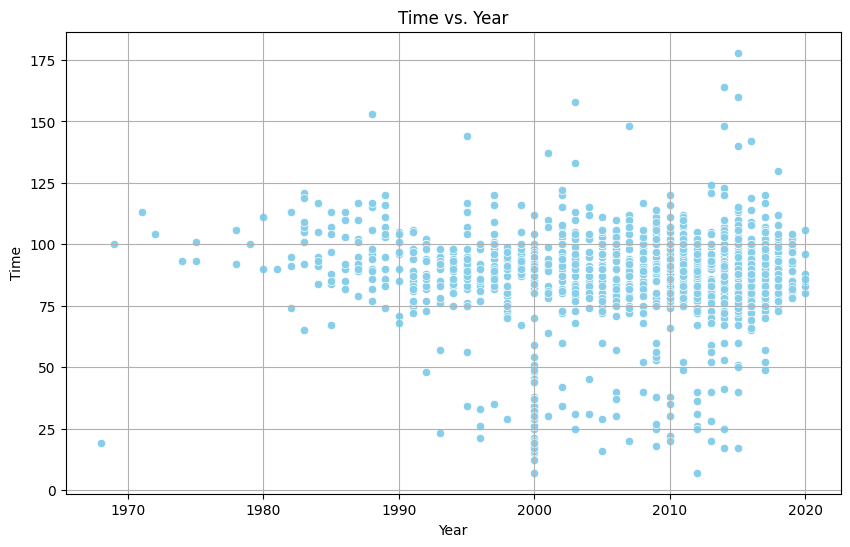

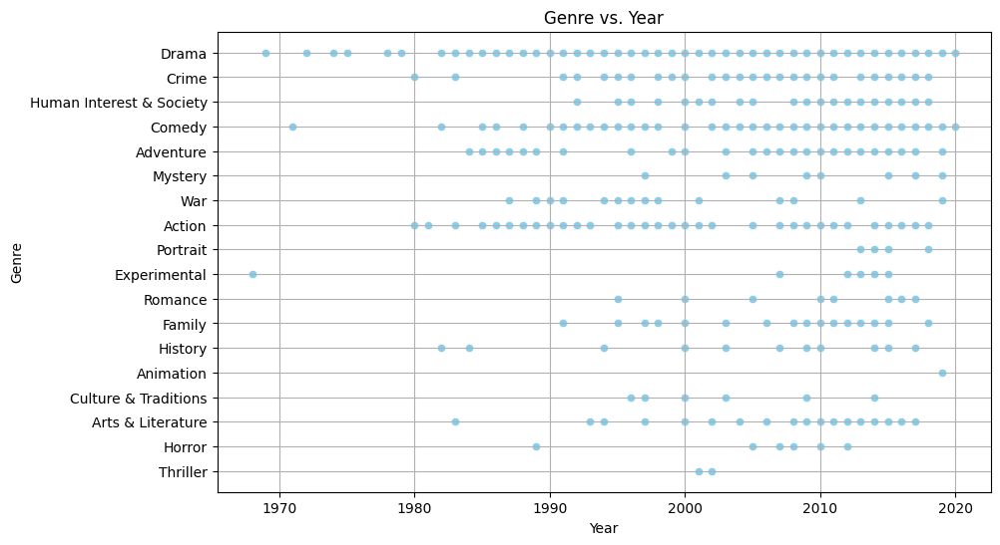

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

class TimeAnalysis:
    def __init__(self, df):
        self.df = df

    def plot_movie_releases(self, time_column):
        """
        Plot line or bar charts for movie releases over time.

        Args:
            time_column (str): The column name containing the time or release year information.

        Returns:
            None (displays the plot)

        TODO:
        1. Check if the time_column contains continuous time data (e.g., years) or discrete time data (e.g., decades).
        2. Create a line or bar chart to show the distribution of movie releases over time using Matplotlib or Seaborn.
        3. Set appropriate titles and labels for the plot.
        4. Display the plot.
        """

        movie_counts = self.df.groupby(time_column).size()

        plt.figure(figsize=(10, 6))
        sns.lineplot(x=movie_counts.index, y=movie_counts.values, marker='o', color='skyblue')
        plt.xlabel(time_column)
        plt.ylabel("Number of Movies Released")
        plt.title("Movie Releases Over Time")
        plt.grid(True)
        plt.show()
        pass

    def explore_time_relationships(self, time_column, other_columns):
        """
        Analyze the relationship between release time and other variables.

        Args:
            time_column (str): The column name containing the time or release year information.
            other_columns (list): A list of column names to explore relationships with.

        Returns:
            None (displays plots or prints analysis)

        TODO:
        1. Iterate through each column in other_columns.
        2. Generate appropriate plots or calculations to explore the relationship between release time and the selected column.
        3. Set appropriate titles and labels for the plots.
        4. Display the plots or print the analysis.
        """
        for col in other_columns:
                plt.figure(figsize=(10, 6))
                sns.scatterplot(data=self.df, x=time_column, y=col, color='skyblue')
                plt.xlabel(time_column)
                plt.ylabel(col)
                plt.title(f"{col} vs. {time_column}")
                plt.grid(True)
                plt.show()
        pass


# Assuming you have a pandas DataFrame named 'df'
time_analysis = TimeAnalysis(movie_df)
time_column = "Year"
other_columns = ["Score", "Time", "Genre"]

# TODO: Call the plot_movie_releases method with the time_column
time_analysis.plot_movie_releases(time_column)

# TODO: Call the explore_time_relationships method with the time_column and other_columns
time_analysis.explore_time_relationships(time_column, other_columns)

In one paragraph, briefly explain what you found interesting in your analysis.



از تحلیل زمان ریلیز شدن فیلم ها به این نتیجه می رسیم که در دیتاست ما، عمده فیلم ها مربوط به زمان 2000 به بعد هستند.
هم چنین، از تحلیل رابطه زمان ریلیز و امتیاز فیلم ها، می توان گفت که فیلم های سال های جدید گرچه امتیاز های بالایی به طور میانگین گرفته اند، اما بخشی از آنها امتیاز هایی پایین دریافت کرده اند.
درباره رابطه تاریخ و مدت زمان فیلم ها، می توان نتیجه گرفت که عمده فیلم ها زمانی بین 75 تا 125 دقیقه دارند.
در نهایت از رابطه تاریخ و ژانر، می توان دید که بعضی از ژانر ها مربوط به سال های جدید تر هستند و به نوعی ژانر هایی تازه تاسیس ترند. مانند ژانر رازآلود و یا ژانر پرتره. در مقابل ژانر هایی مانند درام که از سالیان قبل فیلم هایی با این ژانر ساخته می شده است.

###6. **Rating Analysis**:
   - Visualize the distribution of ratings
   - Obtain the 10 most frequently occurring words for each Rating, based on both the initial summaries and the preprocessed summaries.
   - Explore the relationship between ratings and other variables


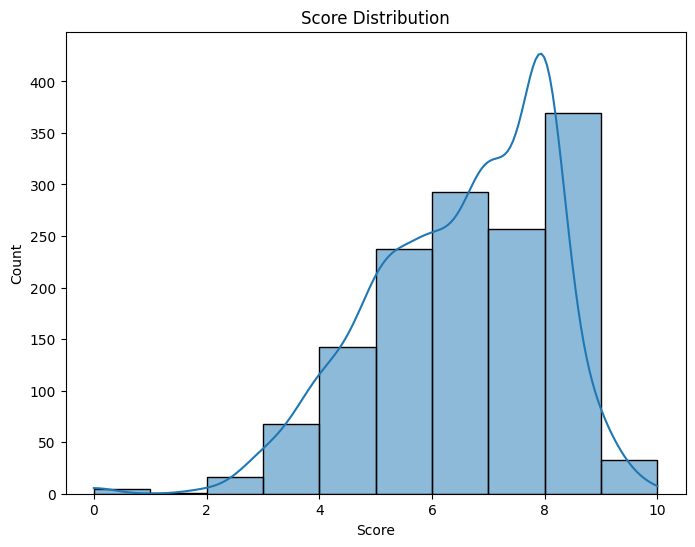

Top words for rating range 0-1 in english (initial summaries): 
to        28
and       17
his       12
a         11
in        10
Parviz    10
of         9
the        8
Mohsen     7
is         7
Name: count, dtype: int64

Top words for rating range 0-1 in english (preprocessed summaries): 
go         10
Parviz      9
Mohsen      8
Nahid       8
let         4
young       4
marry       4
see         3
mind        3
company     3
Name: count, dtype: int64

Top words for rating range 1-2 in english (initial summaries): 
a          5
of         5
the        5
her        4
and        4
boots      3
she        3
Samaneh    2
is         2
when       2
Name: count, dtype: int64

Top words for rating range 1-2 in english (preprocessed summaries): 
boot          4
world         2
pretty        2
child         2
mother        2
new           2
Samaneh       2
work          1
experience    1
introduce     1
Name: count, dtype: int64

Top words for rating range 2-3 in english (initial summaries): 
th

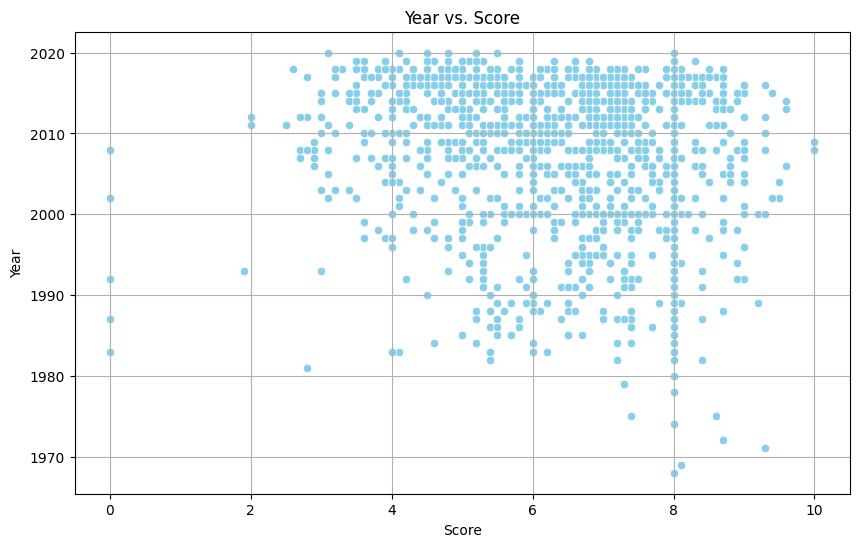

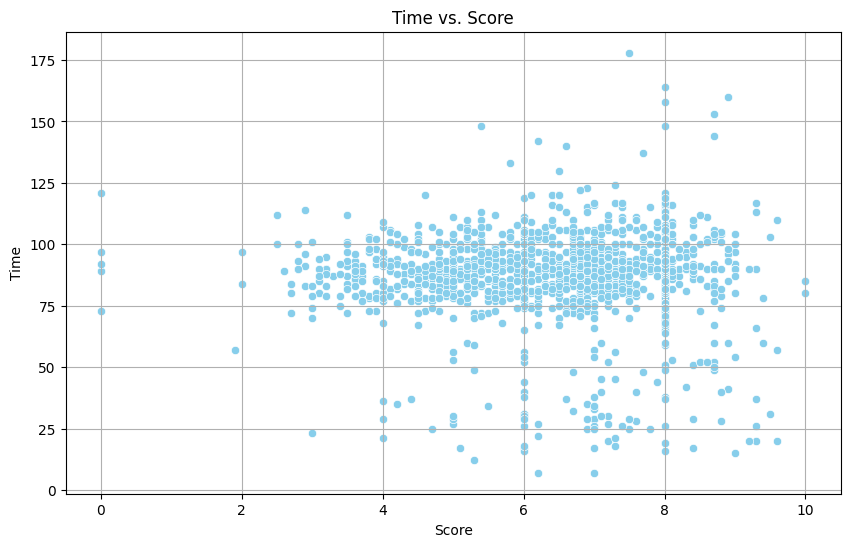

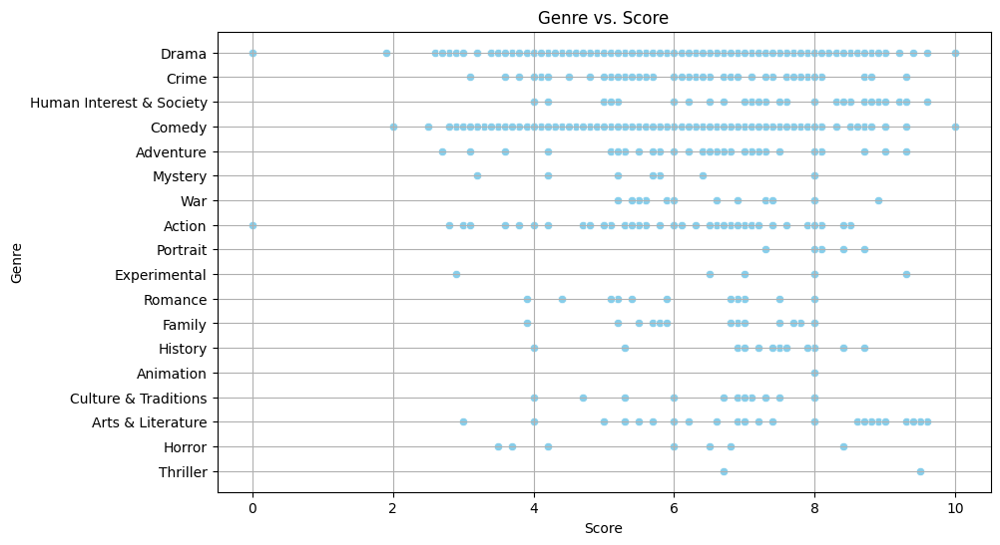

In [25]:
import matplotlib.pyplot as plt
from collections import Counter

class RatingAnalysis:
    def __init__(self, df):
        self.df = df

    def visualize_rating_distribution(self, rating_column):
        """
        Visualize the distribution of ratings.

        Args:
            rating_column (str): The column name containing the rating information.

        Returns:
            None (displays the plot)

        TODO:
        1. Create a histogram or density plot to visualize the distribution of ratings using Matplotlib or Seaborn.
        2. Set appropriate titles and labels for the plot.
        3. Display the plot.
        """

        plt.figure(figsize=(8, 6))
        sns.histplot(data=self.df, x=rating_column, kde=True, bins=10)
        plt.title(f"{rating_column} Distribution")
        plt.xlabel(rating_column)
        plt.ylabel("Count")
        plt.show()

        pass

    def frequent_words_by_rating(self, rating_column, n=10):
        """
        Obtain the 10 most frequently occurring words for each rating, based on both the initial summaries and the preprocessed summaries.

        Args:
            content_column (str): The column name containing the text data.
            rating_column (str): The column name containing the rating information.
            n (int): The number of most frequent words to obtain (default is 10).

        Returns:
            None (prints the top n frequent words for each rating)

        TODO:
        1. Group the data by rating.
        2. For each rating:
            a. Get the top n most frequent words from the initial summaries.
            b. Get the top n most frequent words from the preprocessed summaries (if available).
            c. Print the top n frequent words for both cases.
        """

        rating_ranges = [(i, i + 1) for i in range(10)]

        for lower, upper in rating_ranges:
            filtered_data = self.df[(self.df[rating_column] >= lower) & (self.df[rating_column] < upper)]
            if (upper == 10):
                filtered_data = self.df[(self.df[rating_column] >= lower) & (self.df[rating_column] <= upper)]

            top_words_initial_English = pd.Series(' '.join(filtered_data['Content_2']).split()).value_counts()[:n]
            top_words_Preprocessed_English = pd.Series(' '.join(filtered_data['Preprocessed English']).split()).value_counts()[:n]
            print(f"Top words for rating range {lower}-{upper} in english (initial summaries): \n{top_words_initial_English}\n")
            print(f"Top words for rating range {lower}-{upper} in english (preprocessed summaries): \n{top_words_Preprocessed_English}\n")

        for lower, upper in rating_ranges:
            filtered_data = self.df[(self.df[rating_column] >= lower) & (self.df[rating_column] < upper)]
            if (upper == 10):
                filtered_data = self.df[(self.df[rating_column] >= lower) & (self.df[rating_column] <= upper)]

            top_words_initial_Persian = pd.Series(' '.join(filtered_data['Content_1']).split()).value_counts()[:n]
            top_words_Preprocessed_Persian = pd.Series(' '.join(filtered_data['Preprocessed Persian']).split()).value_counts()[:n]
            print(f"Top words for rating range {lower}-{upper} in persian (initial summaries): \n{top_words_initial_Persian}\n")
            print(f"Top words for rating range {lower}-{upper} in persian (preprocessed summaries): \n{top_words_Preprocessed_Persian}\n")

        pass

    def explore_rating_relationships(self, rating_column, other_columns):
        """
        Explore the relationship between ratings and other variables.

        Args:
            rating_column (str): The column name containing the rating information.
            other_columns (list): A list of column names to explore relationships with.

        Returns:
            None (displays plots or prints analysis)

        TODO:
        1. Iterate through each column in other_columns.
        2. Generate appropriate plots or calculations to explore the relationship between ratings and the selected column.
        3. Set appropriate titles and labels for the plots.
        4. Display the plots or print the analysis.
        """

        for col in other_columns:
                plt.figure(figsize=(10, 6))
                sns.scatterplot(data=self.df, x=rating_column, y=col, color='skyblue')
                plt.xlabel(rating_column)
                plt.ylabel(col)
                plt.title(f"{col} vs. {rating_column}")
                plt.grid(True)
                plt.show()

        pass



rating_analysis = RatingAnalysis(movie_df)

rating_column = "Score"
other_columns = ["Year", "Time", "Genre"]

# TODO: Call the visualize_rating_distribution method with the rating_column
rating_analysis.visualize_rating_distribution(rating_column)

# TODO: Call the frequent_words_by_rating method with the content_column and rating_column
rating_analysis.frequent_words_by_rating(rating_column)

# TODO: Call the explore_rating_relationships method with the rating_column and other_columns
rating_analysis.explore_rating_relationships(rating_column, other_columns)

In one paragraph, briefly explain what you found interesting in your analysis.


از تحلیل توزیع امتیاز فیلم ها می توان به این نتیجه رسید که اکثر فیلم ها امتیازی بین 5 تا 9 دارند.
بر اساس کلمات پر تکرار به ازای بازه هایی به اندازه یک بر اساس امتیاز ها، تفاوت خاصی مشاهده نمی شود زیرا بر اساس امتیاز این کلمات پیدا شده اند و نه ژانر. به طور کلی، کلمات پر تکرار در بازه های متفاوت امتیازی تقریبا یکسان هستند.
بر اساس رابطه امتیاز و تاریخ فیلم، می توان گفت که امتیاز های پایین عمدتا مربوط به فیلم های جدید تر است.
با مقایسه امتیاز فیلم و مدت فیلم به همان نتیجه بخش قبل می رسیم که عمده فیلم ها زمانی بین 75 تا 125 دارند.
و در نهایت با مقایسه امتیاز و ژانر، می توان گفت که به طور میانگین بعضی ژانر ها امتیاز کمتری داشته اند مثل ژانر راز آلود و بعضی دیگر امتیاز بیشتری داشته اند مانند ژانر پرتره. هر چند بخشی از این اتفاق به علت تعداد کم فیلم ها مربوط به بعضی ژانر هاست.

###7. **Correlation and Multivariate Analysis**:
   - Calculate correlation coefficients between numerical variables
   - Use scatter plot matrices or pair plots for multivariate visualization
   - Employ dimensionality reduction techniques (e.g., PCA) for better visualization

Correlation Matrix:
          Score      Year      Time
Score  1.000000 -0.123106 -0.011619
Year  -0.123106  1.000000  0.006609
Time  -0.011619  0.006609  1.000000



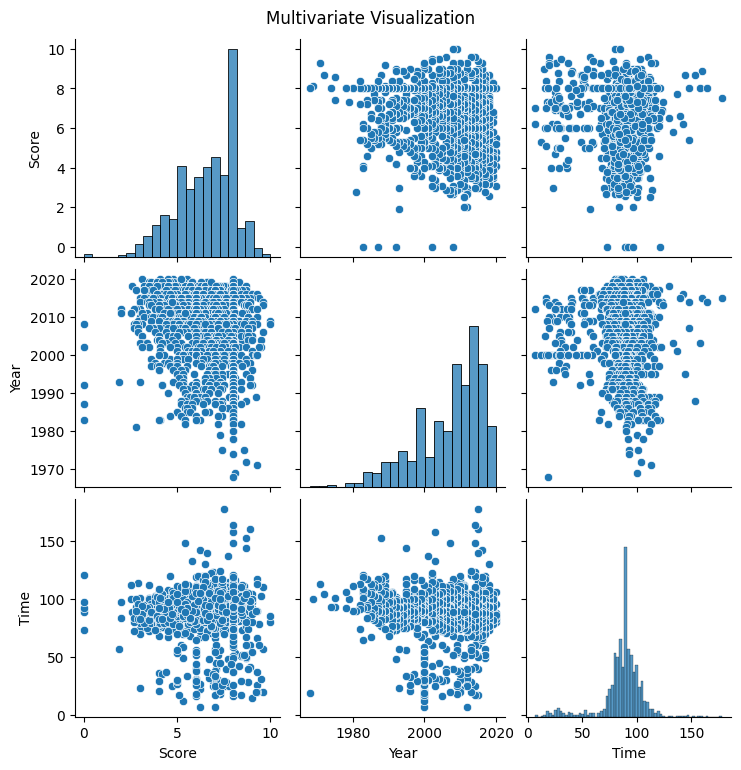

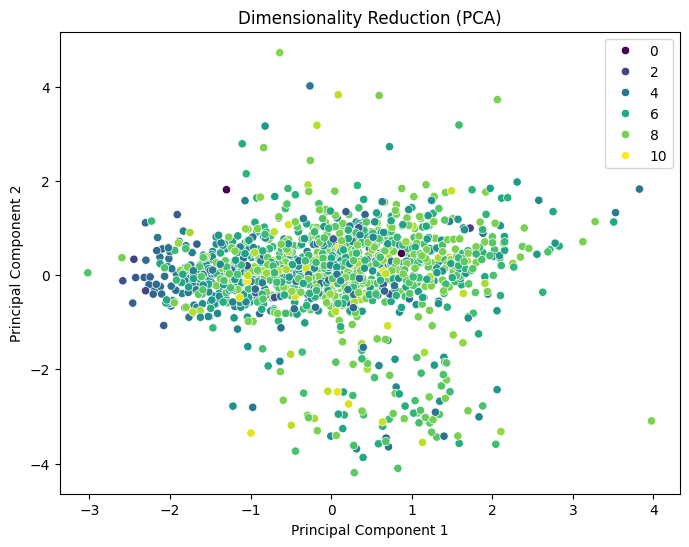

In [26]:
# Feel free to add any desired methods to the class below this is a suggestion.
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

class MultivariateAnalysis:
    def __init__(self, df):
        self.df = df

    def calculate_correlations(self, numerical_cols):
        """
        Calculate correlation coefficients between numerical variables.

        Args:
            numerical_cols (list): A list of column names containing numerical data.

        Returns:
            None (prints the correlation matrix)

        TODO:
        1. Select the numerical columns from the DataFrame.
        2. Calculate the correlation matrix between the numerical columns.
        3. Print the correlation matrix.
        """

        numerical_df = self.df[numerical_cols]
        correlation_matrix = numerical_df.corr()
        print("Correlation Matrix:")
        print(correlation_matrix)
        print()

        pass

    def visualize_multivariate(self, numerical_cols):
        """
        Use scatter plot matrices or pair plots for multivariate visualization.

        Args:
            numerical_cols (list): A list of column names containing numerical data.

        Returns:
            None (displays the multivariate plot)

        TODO:
        1. Select the numerical columns from the DataFrame.
        2. Create a scatter plot matrix or pair plot using Matplotlib or Seaborn for multivariate visualization.
        3. Set appropriate titles and labels for the plot.
        4. Display the plot.
        """

        numerical_df = self.df[numerical_cols]
        sns.pairplot(numerical_df)
        plt.suptitle("Multivariate Visualization", y=1.02)
        plt.show()

        pass

    def dimensionality_reduction(self, numerical_cols, target_column=None):
        """
        Employ dimensionality reduction techniques (e.g., PCA) for better visualization.

        Args:
            numerical_cols (list): A list of column names containing numerical data.
            target_column (str, optional): The column name containing the target variable (if applicable).

        Returns:
            None (displays the dimensionality-reduced plot)

        TODO:
        1. Select the numerical columns from the DataFrame.
        2. Perform standardization on the numerical data.
        3. Apply Principal Component Analysis (PCA) or another dimensionality reduction technique.
        4. If a target_column is provided, color the data points based on the target variable.
        5. Create a scatter plot for the first two principal components.
        6. Set appropriate titles and labels for the plot.
        7. Display the plot.
        """

        numerical_df = self.df[numerical_cols]

        scaler = StandardScaler()
        standardized_data = scaler.fit_transform(numerical_df)

        pca = PCA(n_components=2)
        principal_components = pca.fit_transform(standardized_data)

        pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

        if target_column:
            pca_df[target_column] = self.df[target_column]

        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue=target_column, palette='viridis')
        plt.title("Dimensionality Reduction (PCA)")
        plt.xlabel("Principal Component 1")
        plt.ylabel("Principal Component 2")
        plt.legend()
        plt.show()

        pass

# Example usage
numerical_cols = ["Score", "Year", "Time" ]
target_column = 'Score' # This is a suggestion feel free to try other targets as well.

# Assuming you have a pandas DataFrame named 'df'
multivariate_analysis = MultivariateAnalysis(movie_df)

# TODO: Call the calculate_correlations method with the numerical_cols list
multivariate_analysis.calculate_correlations(numerical_cols)

# TODO: Call the visualize_multivariate method with the numerical_cols list
multivariate_analysis.visualize_multivariate(numerical_cols)

# TODO: Call the dimensionality_reduction method with the numerical_cols list and target_column
multivariate_analysis.dimensionality_reduction(numerical_cols, target_column)

In one paragraph, briefly explain what you found interesting in your analysis.


از مقایسه ماتریس کورلیشن، می توان فهمید که ستون های متفاوت، ارتباط چندانی با هم ندارند و تقریبا مستقل اند.
هم چنین بر اساس PCA تا حدی می توان گفت که امتیاز های پایین تر در سمت چپ این نمودار قرار دارند.

###8. **Outlier Detection**:
   - Identify and investigate potential outliers
   - Determine if outliers are genuine or result from data issues

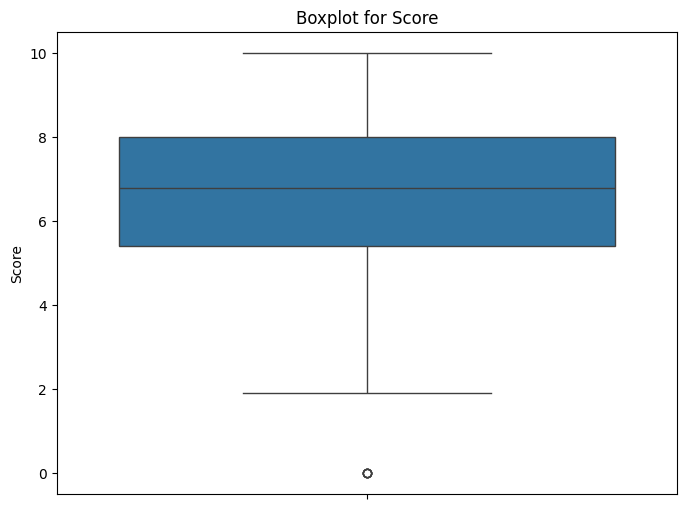

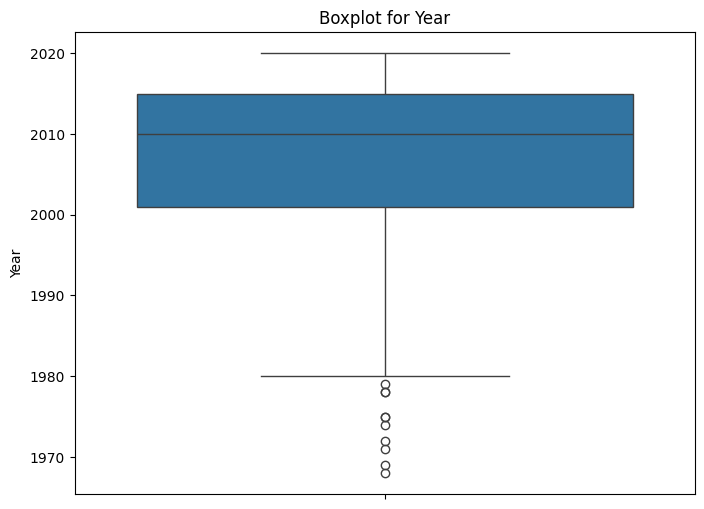

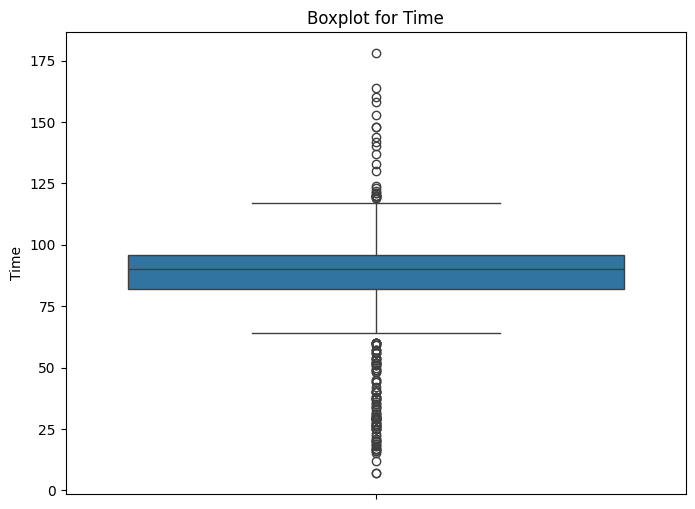

Potential outliers for Score:
(5, 12)
              EN_title  Score   Genre
93            Weakness    0.0   Drama
177             Autumn    0.0   Drama
831   Shoot the Target    0.0  Action
1055         Tokyo Non    0.0   Drama
1306    Comeback Glory    0.0   Drama

Potential outliers for Year:
(10, 12)
                      EN_title  Year  Genre
1424                      Viva  1979  Drama
1425  The Journey of the Stone  1978  Drama
1426                Desiderium  1978  Drama
1427                Still Life  1975  Drama
1428                 The Cycle  1975  Drama

Potential outliers for Time:
(139, 12)
                                EN_title  Time      Genre
93                              Weakness   121      Drama
95   The Midday Adventures The Bloodpath   130     Action
123                         Twenty Weeks    60      Drama
147                     Saint Petersburg   120  Adventure
157                       The Other Wife   148      Drama



In [27]:
# Feel free to add any desired methods to the class below this is a suggestion you can change it anyway you like!


class OutlierDetection:
    def __init__(self, df):
        self.df = df

    def identify_outliers(self, numerical_cols):
        """
        Identify and visualize potential outliers for numerical variables.

        Args:
            numerical_cols (list): A list of column names containing numerical data.

        Returns:
            None (displays the plots for identifying outliers)

        TODO:
        1. Iterate through each numerical column.
        2. Create a boxplot for each column using Matplotlib or Seaborn.
        3. Set appropriate titles and labels for the plots.
        4. Display the plots.
        """

        for col in numerical_cols:
            plt.figure(figsize=(8, 6))
            sns.boxplot(data=self.df, y=col)
            plt.title(f"Boxplot for {col}")
            plt.ylabel(col)
            plt.show()

        pass

    def investigate_outliers(self, numerical_cols):
        """
        Investigate potential outliers and determine if they are genuine or result from data issues.

        Args:
            numerical_cols (list): A list of column names containing numerical data.

        Returns:
            None (prints the analysis of potential outliers)

        TODO:
        1. Iterate through each numerical column.
        2. Identify potential outliers using appropriate techniques (e.g., IQR, z-score).
        3. Investigate the potential outliers by examining their values and associated data.
        4. Determine if the potential outliers are genuine or result from data issues.
        5. Print the analysis of potential outliers, including any insights or recommendations.
        """

        for col in numerical_cols:
            Q1 = self.df[col].quantile(0.25)
            Q3 = self.df[col].quantile(0.75)
            IQR = Q3 - Q1

            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outliers = self.df[(self.df[col] < lower_bound) | (self.df[col] > upper_bound)]

            if outliers.empty:
                print(f"No potential outliers found for {col}.")
            else:
                print(f"Potential outliers for {col}:")
                print(outliers.shape)
                if col == "Score":
                    print(outliers.iloc[:5, [1, 6, 8]])
                    print()
                if col == "Year":
                    print(outliers.iloc[:5, [1, 7, 8]])
                    print()
                if col == "Time":
                    print(outliers.iloc[:5, [1, 9, 8]])
                    print()

        pass



# Assuming you have a pandas DataFrame named 'df'
outlier_detection = OutlierDetection(movie_df)
numerical_cols = ["Score", "Year", "Time" ]

# TODO: Call the identify_outliers method with the numerical_cols list
outlier_detection.identify_outliers(numerical_cols)

# TODO: Call the investigate_outliers method with the numerical_cols list
outlier_detection.investigate_outliers(numerical_cols)


درباره داده های پرت مربوط به امتیاز فیلم ها، داده های پرت، فیلم هایی با امتیاز 0 هستند که به نظر می رسد ناشی از اشتباه در دیتاست باشند زیرا ما حتی امتیاز های نزدیک به آن را هم در دیتاست نداریم.
درباره داده های پرت مربوط به تاریخ فیلم ها، طبیعتا این امر به معنی داده پرت بودن نیست زیرا فیلم هایی از سالیان دور ساخته شده اند و به نوعی توزیع فیلم ها در دیتاست ما بیشتر به سمت فیلم های جدید است.
درباره مدت زمان فیلم ها هم به نظر نمی رسد این داده ها داده پرت به معنی واقعی باشند زیرا به هر حال فیلم هایی با این مدت زمان هر چند در تعداد کمتر ساخته می شوند.

###9. **Data Balancing and Feature Engineering**:

*   Genre Mapping and Balancing

*   Resampling Considerations
*   Encoding Categorical Variables




It is possible to map different genres that are similar to a set of base genres. This approach can help avoid an excessive number of unbalanced categories. Here, we provide a mapping of genres that you can utilize if you find it useful. To further maintain a balanced dataset, you can explore resampling techniques.



This is the mapping I came up with, you can change it if you like.

In [28]:
count1 = movie_df['Content_1'].value_counts().get('', 0)
count2 = movie_df['Content_2'].value_counts().get('', 0)
print(f"Number of ''s in the Content_1 column: {count1}")
print(f"Number of ''s in the Content_2 column: {count2}")
print(movie_df.shape)

Number of ''s in the Content_1 column: 345
Number of ''s in the Content_2 column: 206
(1421, 12)


In [29]:
movie_df = movie_df[movie_df['Content_1'] != '']
movie_df = movie_df[movie_df['Content_2'] != '']
count1 = movie_df['Content_1'].value_counts().get('', 0)
count2 = movie_df['Content_2'].value_counts().get('', 0)
print(f"Number of ''s in the Content_1 column: {count1}")
print(f"Number of ''s in the Content_2 column: {count2}")
print(movie_df.shape)

Number of ''s in the Content_1 column: 0
Number of ''s in the Content_2 column: 0
(932, 12)


In [30]:
movie_df.to_csv('df_2.csv', index=False)

In [4]:
dataset_path = 'df_2.csv'
movie_df = pd.read_csv(dataset_path)

print(movie_df.shape)
movie_df.head()

(932, 12)


,Link,EN_title,PENGLISH_title,PERSIAN_title,Content_1,Content_2,Score,Year,Genre,Time,Preprocessed English,Preprocessed Persian
0,https://www.imvbox.com/watch-persian-movie-ira...,Local Anaesthetic,Bi Hessie Mozeie,بی‌حسی موضعی,جلال‌، دانشجوی سابق رشته فلسفه، متوجه می‌شود خ...,"Jalal, a dropouts philosophy student, realizes...",4.8,2018,Drama,73,Jalal dropout philosophy student realize siste...,جلال دانشجوی سابق رشته فلسفه متوجه خواهرش اختل...
1,https://www.imvbox.com/watch-persian-movie-ira...,Disturbance,Ashoftegi,آشفته گی,«آشفته‌گی» رئالیستی و اجتماعی نیست. یک فیلم اس...,"After the murder of his rich twin brother, Bar...",3.8,2018,Crime,78,murder rich twin brother Barbod assume identit...,آشفتهگی رئالیستی اجتماعی فیلم عشق جنایت
2,https://www.imvbox.com/watch-persian-movie-ira...,Highlight,Haylayt,هایلایت,یک تصادف اتومبیل آدم‌هایی را در تقابل با هم قر...,A man and a woman are have a car accident and ...,4.4,2017,Drama,77,man woman car accident go coma spouse know two...,تصادف اتومبیل آدمهایی تقابل قرار مراقبت مصدومی...
3,https://www.imvbox.com/watch-persian-movie-ira...,Gilda,Geelda,گیلدا,گیلدا ماجرای زنی به نام «گیلدا» را روایت می کن...,Gilda who owns a restaurant has a terrible nig...,3.8,2018,Drama,79,Gilda restaurant terrible night till morning s...,گیلدا ماجرای زنی نام گیلدا روایت صاحب رستوانیس...
4,https://www.imvbox.com/watch-persian-movie-ira...,Atmosphere Station,Istgahe Atmosfer,ایستگاه اتمسفر,این فیلم روایت گر داستان زندگی زوج جوانی به اس...,Vahid and Marjan are a young couple who have g...,5.6,2017,Drama,85,Vahid Marjan young couple get divorce month ag...,فیلم روایت‌گر داستان زندگی زوج جوانی اسم مرجان...


In [5]:
genre_dict = {
    'Romance': 'Drama',
    'Animation': 'Comedy',
    'Crime': 'Action',
    'War': 'Action',
    'Adventure': 'Action',
    'Mystery': 'Action',
    'Horror': 'Action',
    'Thriller': 'Action',
    'Human Interest & Society': 'Culture',
    'Arts & Literature': 'Culture',
    'Family': 'Culture',
    'History': 'Culture',
    'Architecture': 'Culture',
    'Experimental': 'Culture',
    'Music': 'Culture',
    'Portrait': 'Culture'
}

movie_df['New_Genre'] = movie_df['Genre'].map(genre_dict).fillna(movie_df['Genre'])


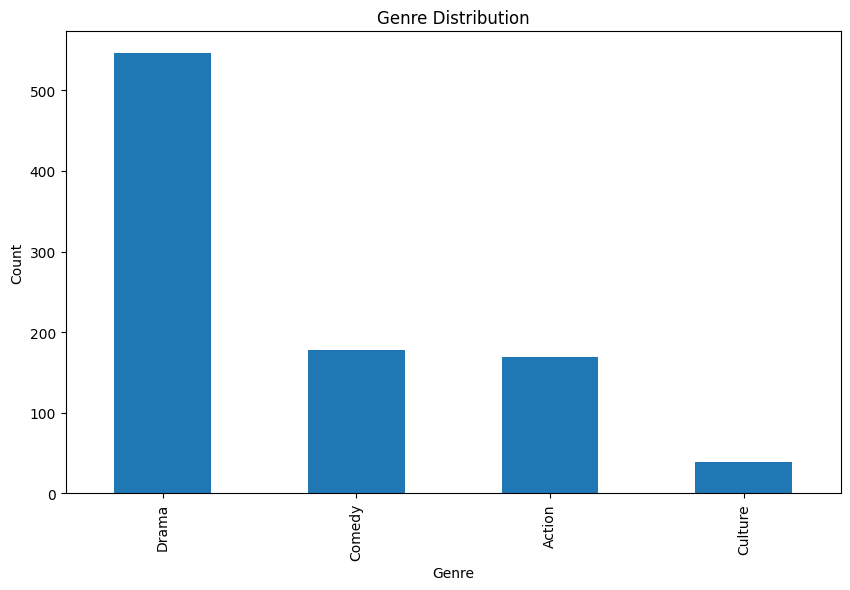

In [6]:
genre_counts = movie_df['New_Genre'].value_counts()
plt.figure(figsize=(10, 6))
genre_counts.plot(kind='bar')
plt.title('Genre Distribution')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


However, it is crucial to exercise caution when applying resampling methods. While these techniques can help balance the dataset, oversampling should not be excessive, as it may lead to model overfitting due to the model being exposed to repeated instances of the data. If you choose to train your model on an oversampled version of the dataset, ensure that your test dataset remains unaffected by the resampling process. It is recommended to split the data into an 80/20 ratio (train/test) before proceeding with resampling. (seed=42)



In [7]:
# Based on above description, you can modify the given class.
from imblearn.over_sampling import RandomOverSampler

class DataResampling:
    def __init__(self, df, target_col):
        self.df = df
        self.target_col = target_col

    def split_data(self, test_size=0.2, random_state=42):
        """
        Split the dataset into training and testing sets.

        Args:
            test_size (float): The proportion of the dataset to include in the test split (default: 0.2).
            random_state (int): The random seed for reproducibility (default: 42).

        Returns:
            tuple: (X_train, X_test, y_train, y_test)
                X_train (pandas.DataFrame): Training features.
                X_test (pandas.DataFrame): Testing features.
                y_train (pandas.Series): Training target.
                y_test (pandas.Series): Testing target.

        TODO:
        1. Separate the target variable from the features.
        2. Split the dataset into training and testing sets using the provided test_size and random_state.
        3. Return the training and testing features and targets.
        """

        columns_to_drop = [self.target_col, 'Link', 'EN_title', 'PENGLISH_title', 'PERSIAN_title', 'Score', 'Year', 'Time', 'Genre']
        X = self.df.drop(columns=columns_to_drop)
        y = self.df[self.target_col]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
        return X_train, X_test, y_train, y_test

        pass

    def resample_data(self, X_train, y_train, random_state=42):
        """
        Apply resampling techniques to balance the training dataset.

        Args:
            X_train (pandas.DataFrame): Training features.
            y_train (pandas.Series): Training target.
            random_state (int): The random seed for reproducibility (default: 42).

        Returns:
            tuple: (X_resampled, y_resampled)
                X_resampled (pandas.DataFrame): Resampled training features.
                y_resampled (pandas.Series): Resampled training target.

        TODO:
        1. Identify the class imbalance in the training data.
        2. Apply appropriate resampling techniques (e.g., RandomOverSampler, SMOTE) to balance the classes.
        3. Return the resampled training features and target.
        """

        oversampler = RandomOverSampler(random_state=random_state)

        X_resampled, y_resampled = oversampler.fit_resample(X_train, y_train)

        return X_resampled, y_resampled

        pass

target_col = 'New_Genre'
data_resampling = DataResampling(movie_df, target_col)

# TODO: Call the split_data method to split the dataset into training and testing sets
X_train, X_test, y_train, y_test = data_resampling.split_data()

# TODO: Call the resample_data method to resample the training data
X_resampled, y_resampled = data_resampling.resample_data(X_train, y_train)

In [8]:
y_test.head()

829    Comedy
70     Comedy
631     Drama
506     Drama
703    Action
Name: New_Genre, dtype: object

In [9]:
X_resampled.head()

,Content_1,Content_2,Preprocessed English,Preprocessed Persian
0,طاها دانشجوی الهیات برای نوشتن پایان نامه خود ...,The story of a young college student whose ass...,story young college student whose assignment r...,طاها دانشجوی الهیات نوشتن پایان‌نامه زندانی گذ...
1,فیلم خانه دختر با بازی باران کوثری ، حامد بهدا...,Tomorrow is Samira's wedding ceremony and Baha...,tomorrow Samira wedding ceremony Bahar Parisa ...,فیلم خانه دختر بازی باران کوثری حامد بهداد پگا...
2,معتمدی، خلافکار بزرگ، بر اثر اختلاف، شریک خود ...,"After murdering his business partner abroad, M...",murder business partner abroad Motamedi dreadf...,معتمدی خلافکار اختلاف شریک روشن خارج کشور قتل ...
3,فیلم دیدار با بازی مهران مدیری داستان ژانت پطر...,"Janet, a young photography student, is robbed ...",Janet young photography student rob work assig...,فیلم دیدار بازی مهران مدیری داستان ژانت پطروسی...
4,فیلم بوسیدن روی ماه داستان احترام السادات و فر...,Foroogh and Ehteram are two old ladies with a ...,Foroogh Ehteram two old lady close bond share ...,فیلم بوسیدن ماه داستان احترام السادات فروغ خان...


In [10]:
print(y_resampled.value_counts())
print()
print(y_resampled)

New_Genre
Comedy     440
Action     440
Drama      440
Culture    440
Name: count, dtype: int64

0        Comedy
1        Action
2         Drama
3         Drama
4         Drama
         ...   
1755    Culture
1756    Culture
1757    Culture
1758    Culture
1759    Culture
Name: New_Genre, Length: 1760, dtype: object


Additionally, encoding categorical variables is an essential step in feature engineering for machine learning models. Depending on the nature of your categorical features, you may need to apply techniques such as one-hot encoding or label encoding to convert them into a format suitable for model training.

In [11]:
# Feel free to change or modify this function, this is a suggestion.

# class CategoricalEncoder:
#     def __init__(self, df, categorical_cols):
#         self.df = df
#         self.categorical_cols = categorical_cols

#     def label_encode(self, drop_first=False):
#         """
#         Apply label encoding to categorical variables.

#         Args:
#             drop_first (bool): If True, drop the first column of one-hot encoded data to avoid multicollinearity.

#         Returns:
#             pandas.DataFrame: The DataFrame with categorical variables encoded.

#         TODO:
#         1. Instantiate a LabelEncoder object.
#         2. Iterate through each categorical column.
#         3. Fit and transform the categorical column using the LabelEncoder.
#         4. Replace the original categorical column with the encoded values.
#         5. Return the encoded DataFrame.
#         """

#         label_encoder = LabelEncoder()

#         for col in self.categorical_cols:
#             self.df[col] = label_encoder.fit_transform(self.df[col])

#         return self.df

#         pass

#     def one_hot_encode(self, drop_first=False):
#         """
#         Apply one-hot encoding to categorical variables.

#         Args:
#             drop_first (bool): If True, drop the first column of one-hot encoded data to avoid multicollinearity.

#         Returns:
#             pandas.DataFrame: The DataFrame with categorical variables one-hot encoded.

#         TODO:
#         1. Instantiate a OneHotEncoder object with the appropriate settings (drop_first=drop_first, handle_unknown='ignore').
#         2. Iterate through each categorical column.
#         3. Fit and transform the categorical column using the OneHotEncoder.
#         4. Concatenate the one-hot encoded columns with the original DataFrame.
#         5. Drop the original categorical columns.
#         6. Return the one-hot encoded DataFrame.
#         """
#         pass

def label_encode(y_resampled):
    label_encoder = LabelEncoder()
    encoded_y = label_encoder.fit_transform(y_resampled)
    return pd.Series(encoded_y, index=y_resampled.index)

def one_hot_encode(y_resampled):
    one_hot_df = pd.get_dummies(y_resampled, prefix='target')
    return one_hot_df


one_hot_encoded_y_resampled = one_hot_encode(y_resampled)

encoded_y_resampled = label_encode(y_resampled)
encoded_y_test = label_encode(y_test)

#categorical_cols = ["New_Genre"]
#categorical_encoder = CategoricalEncoder(y_resampled, categorical_cols)

# TODO: Call the label_encode method to apply label encoding
#df_label_encoded = categorical_encoder.label_encode()

# TODO: Call the one_hot_encode method to apply one-hot encoding
# df_one_hot_encoded = categorical_encoder.one_hot_encode(drop_first=True)

In [12]:
print(encoded_y_test)

829    1
70     1
631    3
506    3
703    0
      ..
2      3
835    3
736    0
544    3
5      2
Length: 187, dtype: int64


In [13]:
print(one_hot_encoded_y_resampled)
print()
print(encoded_y_resampled)

      target_Action  target_Comedy  target_Culture  target_Drama
0             False           True           False         False
1              True          False           False         False
2             False          False           False          True
3             False          False           False          True
4             False          False           False          True
...             ...            ...             ...           ...
1755          False          False            True         False
1756          False          False            True         False
1757          False          False            True         False
1758          False          False            True         False
1759          False          False            True         False

[1760 rows x 4 columns]

0       1
1       0
2       3
3       3
4       3
       ..
1755    2
1756    2
1757    2
1758    2
1759    2
Length: 1760, dtype: int64


# Fine-tuning

In [14]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [15]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
        pass

    def __getitem__(self, idx):
        input_ids = self.encodings['input_ids'][idx].clone().detach()
        attention_mask = self.encodings['attention_mask'][idx].clone().detach()
        label = torch.tensor(self.labels[idx])

        return {
            'input_ids': input_ids,
            'attention_mask': attention_mask,
            'label': label
        }
        pass

    def __len__(self):
        return len(self.labels)
        pass

## Persian

In [16]:
# load pre-trained ParsBERT model and its tokenizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments

model_path = "HooshvareLab/bert-base-parsbert-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels = 4)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/434 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.22M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/654M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at HooshvareLab/bert-base-parsbert-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Preprocessed

In [17]:
# Choose train and test data from preprocessed persian data
# tokenize train and test data with max_length 512

from torch.utils.data import random_split

train_data = X_resampled["Preprocessed Persian"].values.tolist()
test_data = X_test["Preprocessed Persian"].values.tolist()
train_labels = encoded_y_resampled.values.tolist()
test_labels = encoded_y_test.values.tolist()

max_length = 512

train_encodings = tokenizer(train_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')
test_encodings = tokenizer(test_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')

dataset = CustomDataset(train_encodings, train_labels)
dataset_test = CustomDataset(test_encodings, test_labels)

train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])


In [18]:
# Train the model using huggingface trainer
num_epochs = 5
training_args = TrainingArguments(
    output_dir = './results',
    num_train_epochs = num_epochs,
    per_device_train_batch_size = 16,
    per_device_eval_batch_size = 64,
    #warmup_steps = 500,
    #weight_decay = 0.01,
    eval_strategy="epoch",
    logging_dir = './logs',
)


In [19]:
import evaluate
metric = evaluate.load("accuracy")

In [20]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

In [21]:
trainer = Trainer(
    model = model,
    args = training_args,
    train_dataset = train_dataset,
    eval_dataset = val_dataset,
    compute_metrics=compute_metrics,
)

trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.379875,0.863636
2,No log,0.393309,0.897727
3,No log,0.427728,0.937500
4,No log,0.479254,0.931818
5,No log,0.448329,0.937500


TrainOutput(global_step=495, training_loss=0.19920319836549086, metrics={'train_runtime': 471.1903, 'train_samples_per_second': 16.808, 'train_steps_per_second': 1.051, 'total_flos': 1379754483719040.0, 'train_loss': 0.19920319836549086, 'epoch': 5.0})

In [22]:
predictions = trainer.predict(dataset_test)
preds = np.argmax(predictions.predictions, axis=-1)

In [23]:
# Calulate the Accuracy and F1-score for test data
# Draw Confusion matrix according to all genres

from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

accuracy = accuracy_score(test_labels, preds)
f1 = f1_score(test_labels, preds, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"F1-score: {f1:.4f}")

conf_matrix = confusion_matrix(test_labels, preds)

print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.6096
F1-score: 0.5647
Confusion Matrix:
[[13  4  0 15]
 [ 5  9  0 23]
 [ 2  3  0  7]
 [ 5  9  0 92]]


### Not Preprocessed


In [24]:
# Repeat all the previous steps for the raw persian data
# Don't forget to load the model again
# load pre-trained ParsBERT model and its tokenizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments

model_path = "HooshvareLab/bert-base-parsbert-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels = 4)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at HooshvareLab/bert-base-parsbert-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [25]:
from torch.utils.data import random_split

train_data = X_resampled["Content_1"].values.tolist()
test_data = X_test["Content_1"].values.tolist()
train_labels = encoded_y_resampled.values.tolist()
test_labels = encoded_y_test.values.tolist()

max_length = 512

train_encodings = tokenizer(train_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')
test_encodings = tokenizer(test_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')

dataset = CustomDataset(train_encodings, train_labels)

dataset_test = CustomDataset(test_encodings, test_labels)

train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

In [26]:
num_epochs = 5
training_args = TrainingArguments(
    output_dir = './results',
    num_train_epochs = num_epochs,
    per_device_train_batch_size = 16,
    per_device_eval_batch_size = 64,
    #warmup_steps = 500,
    #weight_decay = 0.01,
    eval_strategy="epoch",
    logging_dir = './logs',
)


In [27]:
trainer = Trainer(
    model = model,
    args = training_args,
    train_dataset = train_dataset,
    eval_dataset = val_dataset,
    compute_metrics=compute_metrics,
)

trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.447348,0.795455
2,No log,0.353985,0.886364
3,No log,0.505010,0.892045
4,No log,0.510013,0.897727
5,No log,0.490848,0.886364


TrainOutput(global_step=495, training_loss=0.21869956893150252, metrics={'train_runtime': 750.5917, 'train_samples_per_second': 10.552, 'train_steps_per_second': 0.659, 'total_flos': 2083876978360320.0, 'train_loss': 0.21869956893150252, 'epoch': 5.0})

In [28]:
predictions = trainer.predict(dataset_test)
preds = np.argmax(predictions.predictions, axis=-1)

In [29]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

accuracy = accuracy_score(test_labels, preds)
f1 = f1_score(test_labels, preds, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"F1-score: {f1:.4f}")

conf_matrix = confusion_matrix(test_labels, preds)

print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.5936
F1-score: 0.5485
Confusion Matrix:
[[ 9  1  0 22]
 [ 3 10  0 24]
 [ 1  1  1  9]
 [10  5  0 91]]


## English


In [36]:
# load  pre-trained BERT model and its tokenizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments

model_path = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels = 4)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Preprocessed

In [37]:
# Repeat all the needed steps for the preprocessed english data
from torch.utils.data import random_split

train_data = X_resampled["Preprocessed English"].values.tolist()
test_data = X_test["Preprocessed English"].values.tolist()
train_labels = encoded_y_resampled.values.tolist()
test_labels = encoded_y_test.values.tolist()

max_length = 512

train_encodings = tokenizer(train_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')
test_encodings = tokenizer(test_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')

dataset = CustomDataset(train_encodings, train_labels)

dataset_test = CustomDataset(test_encodings, test_labels)

train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

In [38]:
num_epochs = 5
training_args = TrainingArguments(
    output_dir = './results',
    num_train_epochs = num_epochs,
    per_device_train_batch_size = 16,
    per_device_eval_batch_size = 64,
    #warmup_steps = 500,
    #weight_decay = 0.01,
    eval_strategy="epoch",
    logging_dir = './logs',
)


In [39]:
trainer = Trainer(
    model = model,
    args = training_args,
    train_dataset = train_dataset,
    eval_dataset = val_dataset,
    compute_metrics=compute_metrics,
)

trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.684316,0.750000
2,No log,0.299784,0.892045
3,No log,0.296490,0.926136
4,No log,0.261883,0.943182
5,No log,0.262987,0.948864


TrainOutput(global_step=495, training_loss=0.35268107712870894, metrics={'train_runtime': 493.9795, 'train_samples_per_second': 16.033, 'train_steps_per_second': 1.002, 'total_flos': 1493716505973120.0, 'train_loss': 0.35268107712870894, 'epoch': 5.0})

In [40]:
predictions = trainer.predict(dataset_test)
preds = np.argmax(predictions.predictions, axis=-1)

In [41]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

accuracy = accuracy_score(test_labels, preds)
f1 = f1_score(test_labels, preds, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"F1-score: {f1:.4f}")

conf_matrix = confusion_matrix(test_labels, preds)

print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.6417
F1-score: 0.6008
Confusion Matrix:
[[16  0  0 16]
 [ 2 10  0 25]
 [ 1  1  1  9]
 [11  2  0 93]]


### Not Preprocessed


In [42]:
# Repeat all the previous steps for the raw english data
# Don't forget to load the model again
# load  pre-trained BERT model and its tokenizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments

model_path = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels = 4)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [43]:
from torch.utils.data import random_split

train_data = X_resampled["Content_2"].values.tolist()
test_data = X_test["Content_2"].values.tolist()
train_labels = encoded_y_resampled.values.tolist()
test_labels = encoded_y_test.values.tolist()

max_length = 512

train_encodings = tokenizer(train_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')
test_encodings = tokenizer(test_data, truncation=True, padding=True, max_length=max_length, return_tensors='pt')

dataset = CustomDataset(train_encodings, train_labels)

dataset_test = CustomDataset(test_encodings, test_labels)

train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

In [44]:
num_epochs = 5
training_args = TrainingArguments(
    output_dir = './results',
    num_train_epochs = num_epochs,
    per_device_train_batch_size = 16,
    per_device_eval_batch_size = 64,
    #warmup_steps = 500,
    #weight_decay = 0.01,
    eval_strategy="epoch",
    logging_dir = './logs',
)


In [45]:
trainer = Trainer(
    model = model,
    args = training_args,
    train_dataset = train_dataset,
    eval_dataset = val_dataset,
    compute_metrics=compute_metrics,
)

trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.601312,0.795455
2,No log,0.511959,0.823864
3,No log,0.516556,0.903409
4,No log,0.502923,0.897727
5,No log,0.547727,0.892045


TrainOutput(global_step=495, training_loss=0.28401097769689077, metrics={'train_runtime': 743.7995, 'train_samples_per_second': 10.648, 'train_steps_per_second': 0.666, 'total_flos': 2083876978360320.0, 'train_loss': 0.28401097769689077, 'epoch': 5.0})

In [46]:
predictions = trainer.predict(dataset_test)
preds = np.argmax(predictions.predictions, axis=-1)

In [47]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

accuracy = accuracy_score(test_labels, preds)
f1 = f1_score(test_labels, preds, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"F1-score: {f1:.4f}")

conf_matrix = confusion_matrix(test_labels, preds)

print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.6203
F1-score: 0.5883
Confusion Matrix:
[[12  1  0 19]
 [ 2 13  0 22]
 [ 2  0  1  9]
 [13  2  1 90]]


## Results Analysis

Analyze the results of the Fine-tuning section.


همان طور که انتظار داشتیم، دقت مدل هایی که روی دیتا های پراسس شده ترین شده اند، از دقت مدل هایی که بر روی دیتا های خام آموزش دیده اند اندکی بیشتر است(در هر دو زبان).
البته از آنجا که مدل bert به طور کلی روی جملات عادی آموزش دیده است، این اختلاف چندان زیاد نیست و روی داده های خام هم مدل ما عملکرد مطلوبی دارد.
باید توجه کرد که این مدل ها طبقه بندی 4 کلاسه انجام می دهند و به دقت حدود 60 درصد می رسند که با احتساب این، دقت بدست آمده دقت مطلوبی است.
هم چنین با مقایسه مدل ها و نتایج بدست آمده از دو زبان، می توان گفت که مدل زبان انگلیسی تا حدی عملکرد بهتری نسبت به مدل به زبان فارسی داشته است که می توان عامل این اتفاق را قوی تر بودن مدل pre-train شده به زبان انگلیسی نسبت به همین مدل برای زبان فارسی دانست.